# World Data League 2023

## 🎯 Challenge
Determining The Main Mobility Flows in the City of Lisbon Based on Mobile Device Data


## Team: Random Fourest
## 👥 Authors
* Alina Carvalho
* João Almeida
* José Sousa
* Xavier Silva

## 💻 Development

In [1]:
# Uncomment and run to install the required packages:
# ! pip install pandas
# ! pip install openpyxl
# ! pip install geopandas
# ! pip install matplotlib
# ! pip install tqdm
# ! pip install keplergl

In [2]:
import os
import sys
import io
import json
import time
from datetime import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
import geopandas as gpd
from keplergl import KeplerGl

In [3]:
# Change to point where needed, should have a lisbon_ficheiros_WDL folder:
data_path = "../../../data"

### Assessing Data Quality

#### Grid data

Load the data and assess if the schema matches the provided documentation:

In [4]:
df_grids = pd.read_excel(os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_QUADRICULAS/DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx"))

In [5]:
df_grids

,grelha_id,freguesia,latitude,longitude
0,1,Belém,38.692094,-9.225027
1,2,Belém,38.692094,-9.223231
2,3,Belém,38.692094,-9.221434
3,4,Belém,38.692094,-9.219637
4,5,Belém,38.692094,-9.217841
...,...,...,...,...
3738,3739,Parque das Nações,38.795789,-9.093873
3739,3740,Parque das Nações,38.795789,-9.092077
3740,3741,Parque das Nações,38.797189,-9.097466
3741,3742,Parque das Nações,38.797189,-9.095670


In [6]:
df_dispositivos = pd.concat([
    pd.read_csv(os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_09_0001_4000.csv")),
    pd.read_csv(os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_10_0001_4000.csv")),
    pd.read_csv(os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_11_0001_4000.csv")),
])
df_dispositivos["Datetime"] = pd.to_datetime(df_dispositivos["Datetime"]).dt.tz_localize(None)
df_dispositivos["Datetime"].isna().sum()

0

In [7]:
df_dispositivos

,Grid_ID,Datetime,C1,C2,C3,C4,C5,C6,C7,C8
0,1,2022-09-07 12:30:00,3.690000,0.00,3.69,0.00,0.00,5.28,0.0,0.00
1,1,2022-09-07 22:30:00,0.000000,0.00,0.00,0.00,0.00,0.00,0.0,0.00
2,1,2022-09-07 23:00:00,0.000000,0.00,0.00,0.00,0.00,0.00,0.0,0.00
3,1,2022-09-07 18:00:00,15.720000,0.00,10.48,0.00,5.24,6.84,0.0,2.45
4,1,2022-09-07 06:30:00,3.860000,0.00,1.93,0.00,3.86,4.43,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...
10216646,3743,2022-11-28 00:00:00,15.230000,0.00,15.23,0.00,4.28,16.07,0.0,0.00
10216647,3743,2022-11-28 01:45:00,19.059999,0.00,15.95,0.00,3.12,8.04,0.0,0.00
10216648,3743,2022-11-28 03:45:00,9.890000,0.00,9.89,0.00,0.00,6.85,0.0,0.00
10216649,3743,2022-11-30 05:45:00,15.440000,5.46,10.45,5.46,4.99,7.13,0.0,0.00


Validate the merge of the grids properties data with the metrics:

In [8]:
print("Nulls in grelha_id:", df_grids["grelha_id"].isna().sum())

Nulls in grelha_id: 0


In [9]:
print("Nulls in Grid_ID:", df_dispositivos["Grid_ID"].isna().sum())

Nulls in Grid_ID: 0


In [10]:
dispositivos_grids = pd.Series(df_dispositivos["Grid_ID"].unique())
print("Unmatched grid ids:", len(dispositivos_grids[~dispositivos_grids.isin(df_grids["grelha_id"])]))

Unmatched grid ids: 0


Good, all grid cells match, meaning no unknowns

Lets index the latitudes and longitudes to ease ploting and data structures:

In [11]:
# Create sorted lists for the latitudes and longitudes:
latitudes = df_grids["latitude"].unique()
latitudes.sort()
longitudes = df_grids["longitude"].unique()
longitudes.sort()

# Create indexes for the latitudes and longitudes
df_latitudes = pd.DataFrame(
    {
        "latitude": latitudes,
        "lat_idx": list(range(0, len(latitudes))),
    }
)

df_longitudes = pd.DataFrame(
    {
        "longitude": longitudes,
        "long_idx": list(range(0, len(longitudes)))
    }
)

# Add the indexes to the grid data as a quick way to associated the related grid data:
df_grids_lut = df_grids.merge(
    df_latitudes, how='left', on=["latitude"]
).merge(
    df_longitudes, how='left', on=["longitude"]
)
df_grids_lut

,grelha_id,freguesia,latitude,longitude,lat_idx,long_idx
0,1,Belém,38.692094,-9.225027,0,3
1,2,Belém,38.692094,-9.223231,0,4
2,3,Belém,38.692094,-9.221434,0,5
3,4,Belém,38.692094,-9.219637,0,6
4,5,Belém,38.692094,-9.217841,0,7
...,...,...,...,...,...,...
3738,3739,Parque das Nações,38.795789,-9.093873,74,76
3739,3740,Parque das Nações,38.795789,-9.092077,74,77
3740,3741,Parque das Nações,38.797189,-9.097466,75,74
3741,3742,Parque das Nações,38.797189,-9.095670,75,75


Lets visually assess the cell locations in the grid, they should be continuous:

In [12]:
# Generate some colors:
unique_freguesias = df_grids["freguesia"].unique()
sampled_cmap = mpl.colormaps["turbo"].resampled(len(unique_freguesias)+1)
cmap = {
    f: sampled_cmap(i)
    for i, f in enumerate(unique_freguesias)
}

In [13]:
# Get parishes centers:
df_freguesias_centrums = df_grids.groupby(by=["freguesia"]).agg({
    "latitude": "mean",
    "longitude": "mean"
})

In [14]:
# Define a tranformer factory to project from two linear coordinate spaces:
def get_transformer(x_min, x_max, y_min, y_max):
    def _transformer(v):
        n = (v-x_min)/(x_max-x_min)
        return n * (y_max-y_min) + y_min
    return _transformer

In [15]:
lat_to_y = get_transformer(
    df_grids["latitude"].min(),
    df_grids["latitude"].max(),
    0,
    len(latitudes)-1
)

long_to_x = get_transformer(
    df_grids["longitude"].min(),
    df_grids["longitude"].max(),
    0,
    len(longitudes)-1
)

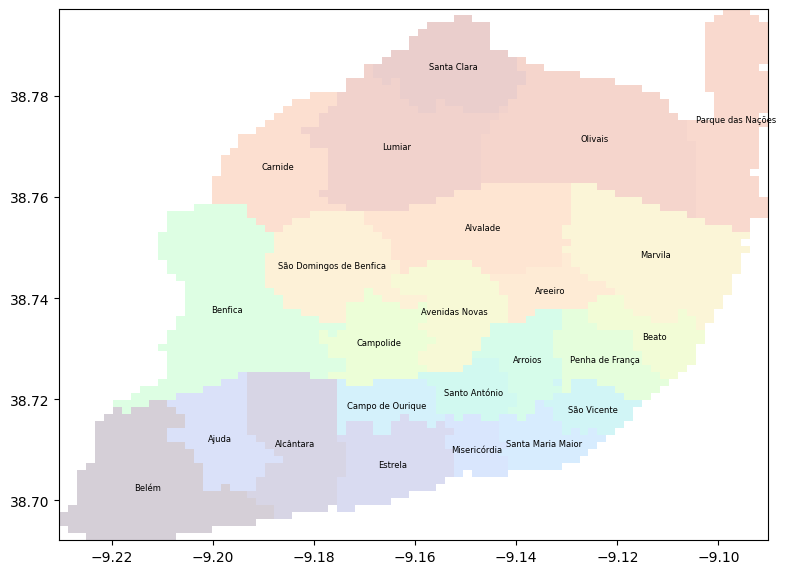

In [16]:
grid_mapping_mask = np.zeros(shape=(len(longitudes), len(latitudes)))
grid_mapping_image = np.zeros(shape=(len(longitudes), len(latitudes), 4))

for lat_idx, latitude in enumerate(latitudes):
    for long_idx, longitude in enumerate(longitudes):
        freguesia = df_grids.loc[
            (df_grids["latitude"] == latitude) &
            (df_grids["longitude"] == longitude),
            "freguesia"
        ].values
        if len(freguesia) == 0:
            grid_mapping_mask[long_idx, lat_idx] = 0
            grid_mapping_image[long_idx, lat_idx] = (0,0,0,0)
        else:
            grid_mapping_mask[long_idx, lat_idx] = 1
            grid_mapping_image[long_idx, lat_idx] = cmap[freguesia[0]]

fig, axs = plt.subplots(1,1,figsize=(8,8), squeeze=False)

axs[0][0].imshow(
    grid_mapping_image.transpose((1,0,2)),
    alpha=0.2,
    origin="lower",
    extent=(
        df_grids["longitude"].min(),
        df_grids["longitude"].max(),
        df_grids["latitude"].min(),
        df_grids["latitude"].max()
    )
)

for row in df_freguesias_centrums.reset_index().itertuples():
    x = long_to_x(row.longitude)
    y = lat_to_y(row.latitude)
    
    axs[0][0].annotate(
        row.freguesia,
        xy=(row.longitude, row.latitude),
        xytext=(row.longitude, row.latitude),
        ha='center', va='center',
        fontsize=6
    )
        
plt.tight_layout()
plt.show()

Okay, looks good.

Look for missing data, lets see if we have partial data for certain time periods:

In [17]:
print("Nulls in the counters:")
df_dispositivos[["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8"]].isna().sum()

Nulls in the counters:


C1    0
C2    0
C3    0
C4    0
C5    0
C6    0
C7    0
C8    0
dtype: int64

No nulls in the counters.

In [18]:
df_holes_dates = df_dispositivos.groupby(by=["Datetime"])["Grid_ID"].nunique()
holes_dates = list(df_holes_dates[df_holes_dates != len(df_grids_lut)].index)

total_cells = len(df_grids_lut)

print("Total Grid cells:", total_cells)
display(df_holes_dates[df_holes_dates != total_cells])
print("Grid cells with partial data:", len(df_holes_dates[df_holes_dates != total_cells]))
holes_dates = df_holes_dates[df_holes_dates != len(df_grids_lut)].index.to_list()

Total Grid cells: 3743


Datetime
2022-09-05 12:00:00    3649
2022-10-04 12:00:00    3340
2022-11-10 08:15:00    3519
2022-11-10 09:00:00    2470
2022-11-10 09:15:00    2499
2022-11-10 09:30:00    2540
2022-11-10 09:45:00    2520
2022-11-10 10:00:00    2490
2022-11-10 10:30:00    2392
2022-11-17 23:30:00    3468
2022-11-18 00:30:00    3186
2022-11-19 03:30:00    3121
Name: Grid_ID, dtype: int64

Grid cells with partial data: 12


We have 12 periods of data where the cells information is partial.

Let's investigate these 12 periods:

In [19]:
def plot_holes(dt, ax):

    df_missings = df_dispositivos.loc[
        (df_dispositivos["Datetime"] == dt),
        "Grid_ID"
    ].value_counts().reset_index().merge(
        df_grids_lut,
        left_on=["index"],
        right_on=["grelha_id"],
        how="outer"
    )

    df_missings["Grid_ID"] = df_missings["Grid_ID"].fillna(2)
    df_missings
    
    grid_mapping_mask = np.zeros(shape=(len(longitudes), len(latitudes)))
    grid_mapping_image = np.zeros(shape=(len(longitudes), len(latitudes)))

    for lat_idx, latitude in enumerate(latitudes):
        for long_idx, longitude in enumerate(longitudes):
            data = df_missings.loc[
                    (df_missings["lat_idx"] == lat_idx) &
                (df_missings["long_idx"] == long_idx),
                "Grid_ID"
            ].values
            if len(data) == 0:
                grid_mapping_mask[long_idx, lat_idx] = 0
                grid_mapping_image[long_idx, lat_idx] = np.nan
            else:
                grid_mapping_mask[long_idx, lat_idx] = 1
                grid_mapping_image[long_idx, lat_idx] = data

    ax.set_title(str(dt))
                
    im = ax.imshow(
        grid_mapping_image.transpose((1,0)),
        alpha=1,
        origin="lower",
        extent=(
            df_grids["longitude"].min(),
            df_grids["longitude"].max(),
            df_grids["latitude"].min(),
            df_grids["latitude"].max()
        )
    )

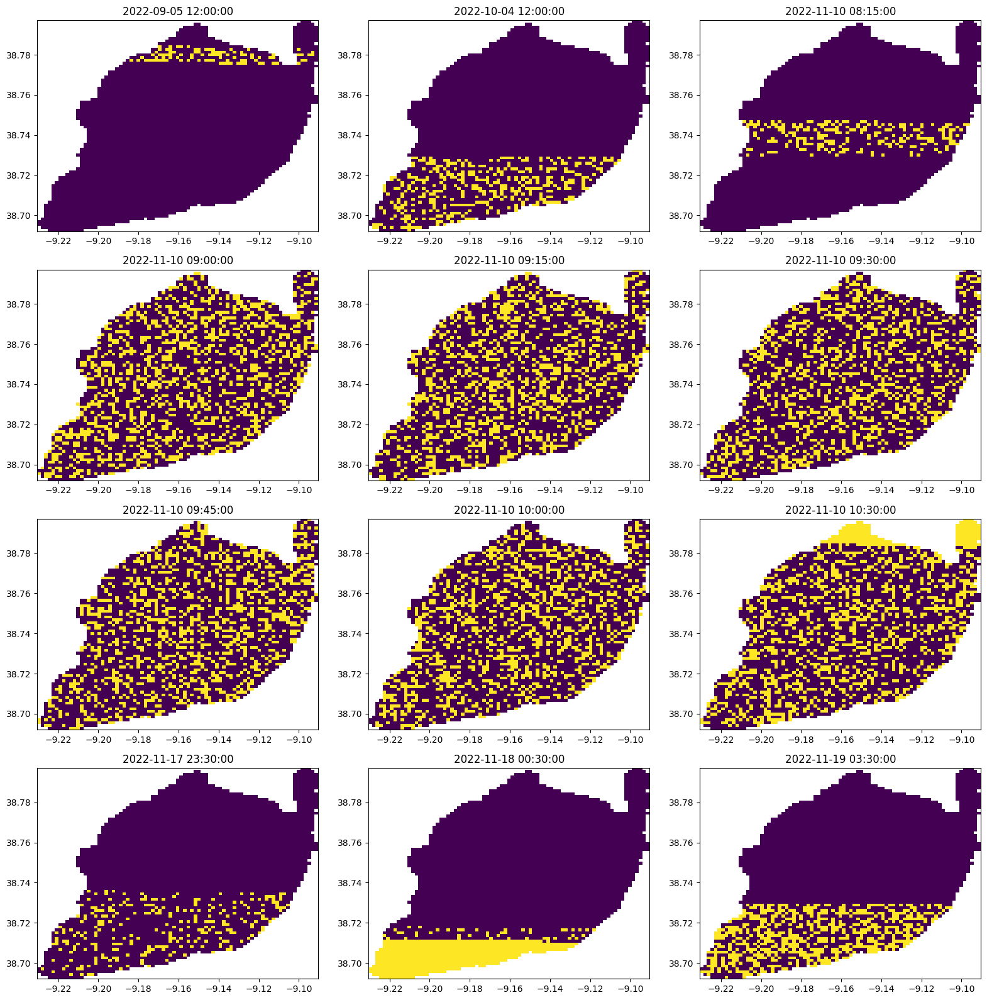

In [20]:
ncols = 3
fig, axs = plt.subplots(int(np.ceil(len(holes_dates)/ncols)), ncols, figsize=(16,16), squeeze=False)

for idx, dt in enumerate(holes_dates):
    plot_holes(dt, axs[int(idx / ncols)][idx % ncols])

plt.tight_layout()
plt.show()

Some seem to follow a random distribution, the data appears to be ingested row by row, given that some periods are continuous it might be tricky to solve this. 

Lets now look how the data is missing in time as a whole:

In [21]:
missing_dates = df_dispositivos.groupby(by=["Datetime"])["Grid_ID"].nunique().reset_index().merge(
    pd.Series(pd.date_range(start=df_dispositivos["Datetime"].min(), end=df_dispositivos["Datetime"].max(), freq="15T")).to_frame("Datetime"),
    how="outer",
    on=["Datetime"]
)
missing_dates["Grid_ID_filled"] = missing_dates["Grid_ID"].fillna(0)
print("Days without data:", missing_dates["Grid_ID"].isna().sum())

Days without data: 483


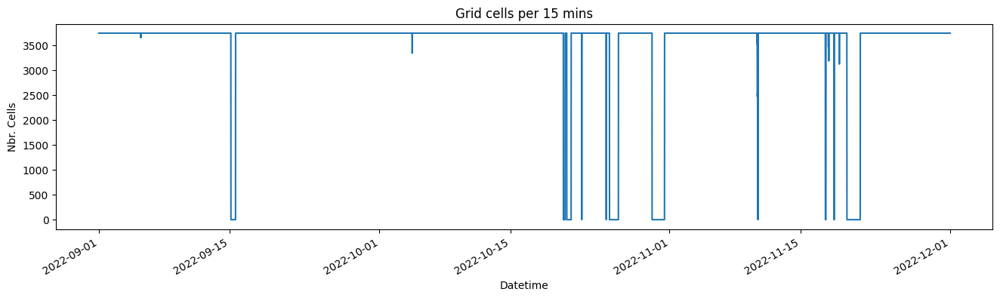

In [22]:
missing_dates.set_index("Datetime")["Grid_ID_filled"].plot(figsize=(16,4), title="Grid cells per 15 mins", ylabel="Nbr. Cells");

There are 483 periods of 15 mins with no data, this might be a big problem as they are in blocks and spread through the dataset.

Look for anomalies:

In [23]:
df_time_evo_data = df_dispositivos.groupby(
    ["Datetime"]
).sum(numeric_only=True).merge(
    pd.Series(pd.date_range(start=df_dispositivos["Datetime"].min(), end=df_dispositivos["Datetime"].max(), freq="15T")).to_frame("Datetime"),
    how="outer",
    on=["Datetime"]
).sort_values(by=["Datetime"])
df_time_evo_data["time_of_day"] = df_time_evo_data["Datetime"].dt.time
df_time_evo_data["day_of_week"] = df_time_evo_data["Datetime"].dt.day_of_week

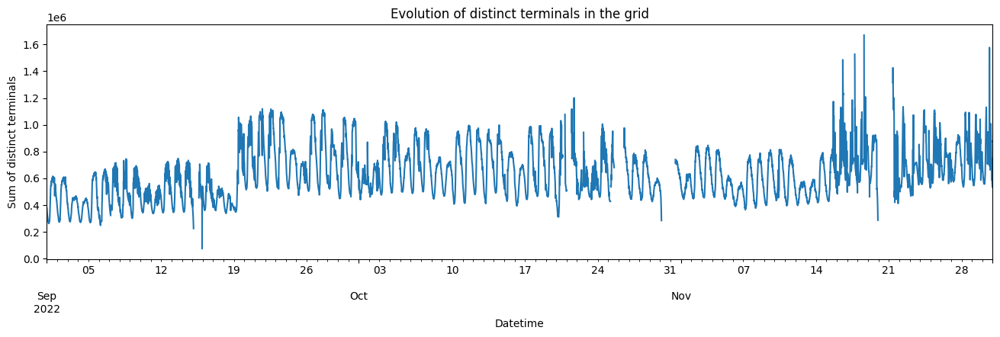

In [24]:
df_time_evo_data.set_index("Datetime")["C1"].plot(figsize=(16,4), title="Evolution of distinct terminals in the grid", ylabel="Sum of distinct terminals");

Just from looking at the total number of distict terminals reported we can say that in the dataset:
* In day 2022-09-19 the number of terminals almost doubles, as a possible occurrence this is highly unlikely, looking at known occurring events, we didn't find any → we shall look into if this increase comes from a specific geographic area within lisbon or if is seen through the entire dataset, for the later case this means that some change in the ingestion process likely occurred spliting the dataset into two.
* There are lots of days where the number of terminals is not coherent, while this could be justified by some events, due to the duration of this fluctuations, issues in data ingestion are more likely.
  * From 2022-09-06 to 2022-10-08 the data is very noisy/dirty
* It is clear that at weekends (and holidays) less people are in Lisbon.
* the data after 2022-10-20 till 2022-11-01 is probably unusable.
* The data after 2022-11-15 is probably unusable.

Lets split the previous analysis through the parishes:

0it [00:00, ?it/s]

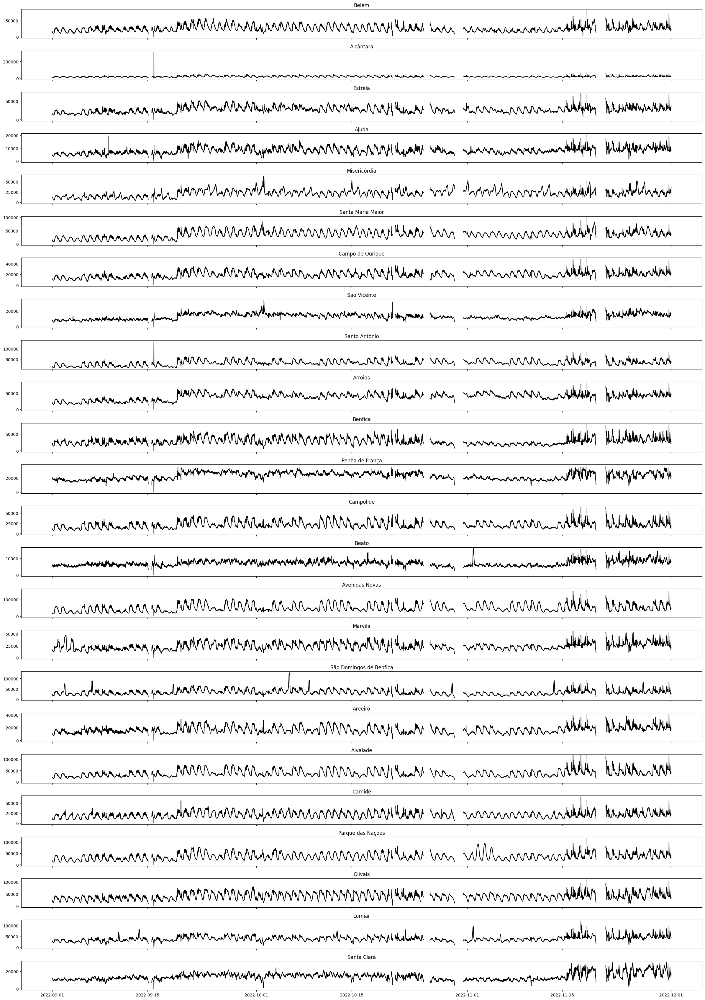

In [25]:
from tqdm.auto import tqdm

freguesias = df_grids["freguesia"].unique()

fig, axs = plt.subplots(len(freguesias),1, figsize=(24,34), squeeze=False, sharex=True)

for i, freg in tqdm(enumerate(freguesias)):
    df_grid_id = df_dispositivos.loc[
        (df_dispositivos["Grid_ID"].isin(df_grids[df_grids["freguesia"]==freg]["grelha_id"]))
        #& (df_dispositivos["Datetime"]>="2022-09-14")
        #& (df_dispositivos["Datetime"]<"2022-09-16")
        ,
        ["Datetime","C1"]
    ].groupby("Datetime").sum().reset_index().merge(
        pd.Series(pd.date_range(start=df_dispositivos["Datetime"].min(), end=df_dispositivos["Datetime"].max(), freq="15T")).to_frame("Datetime"),
        how="outer",
        on=["Datetime"]
    ).sort_values(by=["Datetime"])

    xx = df_grid_id["Datetime"]
    yy = df_grid_id["C1"]
        
    axs[i][0].plot(xx, yy, alpha=1, color="#000")
    axs[i][0].set_title(freg)

    axs[i][0].set_facecolor('white')

fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()

This confirms that the issues with the data are not localized under certain areas:
* At 2022-09-15 22h45 something very wrong happened with the data ingestion, it is noticeable though the whole Lisbon region, but in a few parishes (ex: Alcântara, Santo António) the number of terminals present is, to put it kindly, unrealistic.
* In a similar fashion, at 2022-09-19 22h15, there is a spike in several parishes.
* The increase in day 2022-09-19 is present in the dataset has a whole, it efectivelly forces this data source to be split into two datasets.
* In days 2,3,4 of November there is a really nice increase of terminals during the day, this suggests that a know event is the cause and sure enough we found a match with Web Summit Lisboa'22: https://www.visitlisboa.com/en/events/web-summit-lisboa22
* In days 2022-10-05, 2022-10-08, 2022-10-29, 2022-11-13 in São Domingos de Benfica the increase of terminals matches with the football games in Luz Stadium.
* In days 2022-11-01 and 2022-11-05 in Lumiar we can see the impact of Alvade Stadium games.
* There are some common anomalies that strike as odd, for example, Beato during the evening of 2022-11-01 in the area north of "Escola básica e secundária Luís António Verney" and around "Convento do Beato" there was a substancial increase that looks realistic and impactful, but no registry of events was found. (See appendix for a more in depth analysis)

Just to confirm the workdays vs weekends insight:

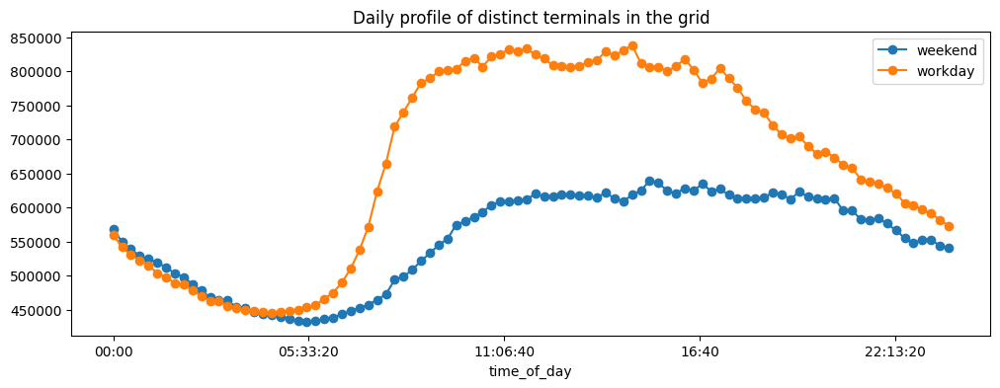

In [26]:
df_time_evo_data[df_time_evo_data["day_of_week"].isin([5,6])].groupby("time_of_day")["C1"].mean().plot(
    figsize=(12,4),
    title="Daily profile of distinct terminals in the grid",
    marker='o',
    label="weekend",
    legend=True
);
df_time_evo_data[df_time_evo_data["day_of_week"].isin([0,1,2,3,4])].groupby("time_of_day")["C1"].mean().plot(
    marker='o',
    label="workday",
    legend=True
);

##### Conclusion

Grid data has severe issues, it is very hard to trust this data source as is, aside from the first few days of September, the days from 2022-10-08 to 2022-10-17 and the first two weeks of November, the usability of the existing data at level of detail it implies (15min in 200m x 200m cells) is questionable.

There is a clear split in the data profile at 2022-09-12, the days before or after this date should be considered as different datasets.

It might be possible to clean some of the data, either by interpolation or inference with homologous periods.

#### Main road axis data

Check schema of the shapefile data files:

In [27]:
points_overlay_shapefile = os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.shp")

In [28]:
polygons_overlay_shapefile = os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOSVIA_POLIGONOS/eixos_polygon.shp")

In [29]:
print(points_overlay_shapefile)
gdf_points = gpd.read_file(points_overlay_shapefile)
display(gdf_points)

../../../data/lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.shp


,OBJECTID,Id,Local,prioridade,POINT_X,POINT_Y,geometry
0,1,2,Marginal,1,-9.233370,38.698775,POINT (-1027854.000 4678615.000)
1,2,3,A5,1,-9.226506,38.716243,POINT (-1027090.000 4681107.000)
2,3,4,N117 (Cabos Ávila),1,-9.214909,38.726378,POINT (-1025799.000 4682553.000)
3,4,5,IC19,1,-9.211091,38.739944,POINT (-1025374.000 4684489.000)
4,5,6,IC16,1,-9.203761,38.764597,POINT (-1024558.000 4688008.000)
5,6,7,Calçada de Carriche,1,-9.166634,38.783457,POINT (-1020425.000 4690701.000)
6,7,9,A1,1,-9.116850,38.787963,POINT (-1014883.051 4691344.411)
7,8,10,Ponte Vasco da Gama,1,-9.085866,38.785544,POINT (-1011434.000 4690999.000)
8,9,11,IC2 (Sacavém),2,-9.105246,38.781063,POINT (-1013591.340 4690359.138)
9,10,1,Ponte 25 Abril,1,-9.177935,38.693488,POINT (-1021683.000 4677861.000)


In [30]:
print(points_overlay_shapefile)
gdf_polygons = gpd.read_file(polygons_overlay_shapefile)
display(gdf_polygons)

../../../data/lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.shp


,id,area,geometry
0,1,373441.199,"POLYGON ((-9.17344 38.67683, -9.17352 38.67683..."
1,2,426858.341,"POLYGON ((-9.28350 38.69782, -9.28249 38.69857..."
2,3,507888.892,"POLYGON ((-9.26706 38.71583, -9.26535 38.71479..."
3,4,359294.923,"POLYGON ((-9.23394 38.74670, -9.23394 38.74670..."
4,5,789560.365,"POLYGON ((-9.26365 38.74928, -9.26273 38.74885..."
5,6,592398.426,"POLYGON ((-9.23606 38.78764, -9.23583 38.78692..."
6,7,440486.328,"POLYGON ((-9.18276 38.81267, -9.18280 38.81123..."
7,8,289146.011,"POLYGON ((-9.13946 38.80312, -9.13867 38.80297..."
8,9,448103.305,"POLYGON ((-9.10477 38.80721, -9.10454 38.80721..."
9,10,1129398.557,"POLYGON ((-8.99149 38.72862, -8.99168 38.72848..."


Check the axis metrics data schema:

In [31]:
axis_metrics_file = os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv")
print(axis_metrics_file)
df_axis_metrics = pd.read_csv(axis_metrics_file)
df_axis_metrics["Datetime"] = pd.to_datetime(df_axis_metrics["Datetime"])
df_axis_metrics

../../../data/lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv


,Eixo,Datetime,extract_year_2,extract_month_3,extract_day_4,C12,C13
0,Ponte 25 Abril,2022-08-31 23:00:00+00:00,2022,8,31,52.919998,36.459999
1,IC16,2022-08-31 23:00:00+00:00,2022,8,31,80.900002,89.019997
2,Marginal,2022-08-31 23:00:00+00:00,2022,8,31,51.470001,41.220001
3,IC19,2022-08-31 23:00:00+00:00,2022,8,31,200.970001,221.169998
4,A1,2022-08-31 23:00:00+00:00,2022,8,31,102.760002,78.669998
...,...,...,...,...,...,...,...
272487,Ponte Vasco da Gama,2022-12-01 00:00:00+00:00,2022,12,1,64.180000,71.440002
272488,A5,2022-12-01 00:00:00+00:00,2022,12,1,304.679993,328.970001
272489,A1,2022-12-01 00:00:00+00:00,2022,12,1,582.349976,541.549988
272490,Calçada de Carriche,2022-12-01 00:00:00+00:00,2022,12,1,231.119995,299.829987


Check how we can relate the data sources:

In [32]:
# From the points data we can obtain the name of the main road axis:
entrances_lut = {identifier: localname for identifier, localname in zip(gdf_points.Id, gdf_points.Local)}

In [33]:
for eixo in df_axis_metrics["Eixo"].unique():
    if eixo not in entrances_lut.values():
        print("{} is missing in the dataset of the axis metrics".format(eixo))

A36 (Túnel do Grilo) is missing in the dataset of the axis metrics


In [34]:
for eixo in entrances_lut.values():
    if eixo not in df_axis_metrics["Eixo"].unique():
        print("{} is missing in the dataset with the road coordinates".format(eixo))

Eixo Norte-Sul is missing in the dataset with the road coordinates


There is a mismatch in the road names between the metrics file and shapefiles, as the `Eixo Norte-Sul` connects with the `A36 (Túnel do Grilo)` → they probably the same.

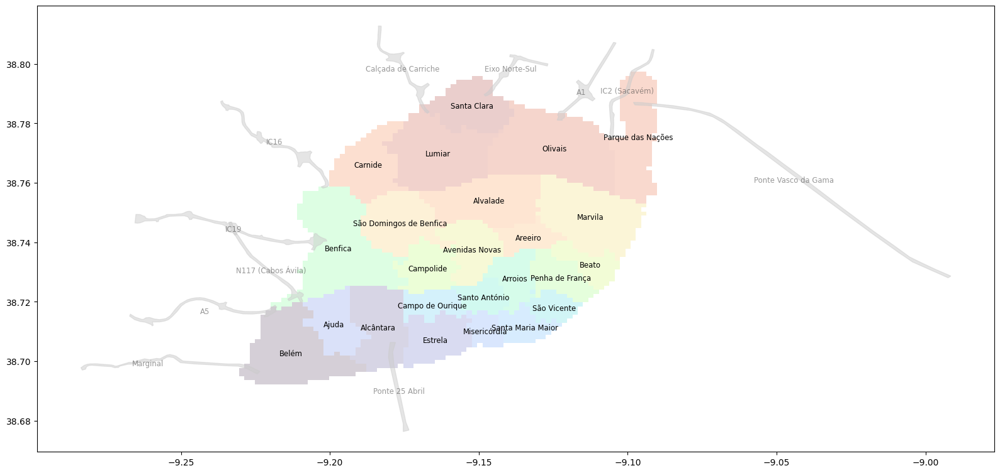

In [35]:
grid_mapping_mask = np.zeros(shape=(len(longitudes), len(latitudes)))
grid_mapping_image = np.zeros(shape=(len(longitudes), len(latitudes), 4))

for lat_idx, latitude in enumerate(latitudes):
    for long_idx, longitude in enumerate(longitudes):
        freguesia = df_grids.loc[
            (df_grids["latitude"] == latitude) &
            (df_grids["longitude"] == longitude),
            "freguesia"
        ].values
        if len(freguesia) == 0:
            grid_mapping_mask[long_idx, lat_idx] = 0
            grid_mapping_image[long_idx, lat_idx] = (0,0,0,0)
        else:
            grid_mapping_mask[long_idx, lat_idx] = 1
            grid_mapping_image[long_idx, lat_idx] = cmap[freguesia[0]]

fig, axs = plt.subplots(1,1,figsize=(16,12), squeeze=False)

axs[0][0].imshow(
    grid_mapping_image.transpose((1,0,2)),
    alpha=0.2,
    origin="lower",
    extent=(
        df_grids["longitude"].min(),
        df_grids["longitude"].max(),
        df_grids["latitude"].min(),
        df_grids["latitude"].max()
    )
)

# Annotate freguesias
for row in df_freguesias_centrums.reset_index().itertuples():
    x = long_to_x(row.longitude)
    y = lat_to_y(row.latitude)
    
    axs[0][0].annotate(
        row.freguesia,
        xy=(row.longitude, row.latitude),
        xytext=(row.longitude, row.latitude),
        ha='center', va='center',
        fontsize='small'
    )
    
# Display entrance/exits
for identifier, polygon in zip(gdf_polygons.id, gdf_polygons.geometry):
    x, y = polygon.exterior.coords.xy
    
    x_mean = np.mean(x)
    y_mean = np.mean(y)
    
    axs[0][0].fill(x, y, c="#CCC", alpha=0.5)
    axs[0][0].annotate(
        entrances_lut[identifier],
        xy=(x_mean, y_mean),
        xytext=(x_mean, y_mean),
        ha='center', va='center',
        color="#333", alpha=0.5,
        fontsize='small'
    )

        
plt.tight_layout()
plt.show()

In [36]:
sum_c12, sum_c13 = df_axis_metrics[["C12", "C13"]].sum(axis=0).values
print("Total entrances: {:.1f}".format(sum_c12))
print("Total exits:     {:.1f}".format(sum_c13))
print("Difference: {:.1f}".format(sum_c12 - sum_c13))
print("Entrances extra ratio (%): {:.2f}".format((sum_c12 - sum_c13)*100/sum_c12))

Total entrances: 30349697.7
Total exits:     29571798.2
Difference: 777899.5
Entrances extra ratio (%): 2.56


Unless the population is Lisbon actually increased 2.5% in 3 months, something quite wrong is going on with these metrics.

Even if we account for the fact that people can leave Lisbon through airplane, boat, train, on foot, or using other roads, they can also enter through those means. A 2.5% difference might seem low, but it is quite substantitial, if this mirrors the reality then we are curious to know through where these people leave Lisbon.

Checking the data over time:

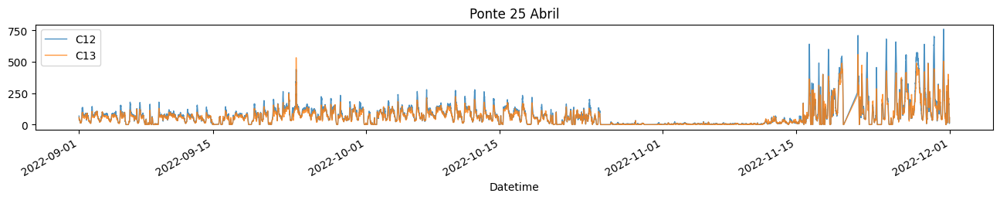

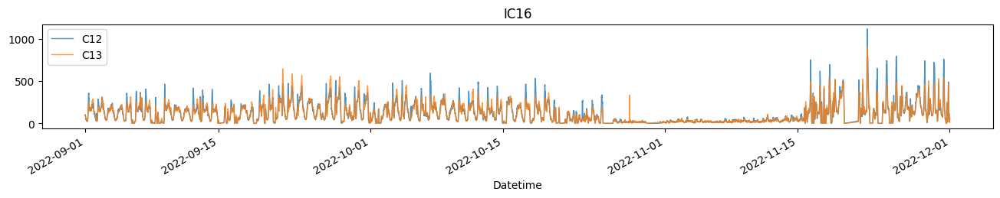

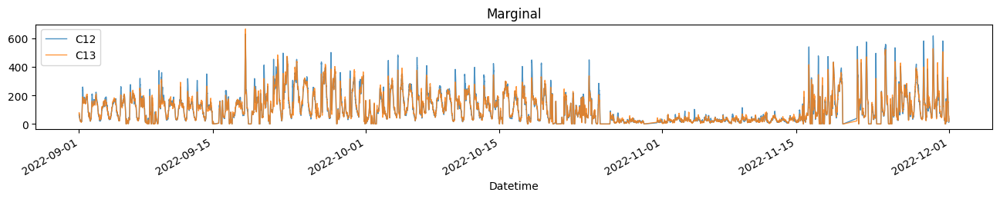

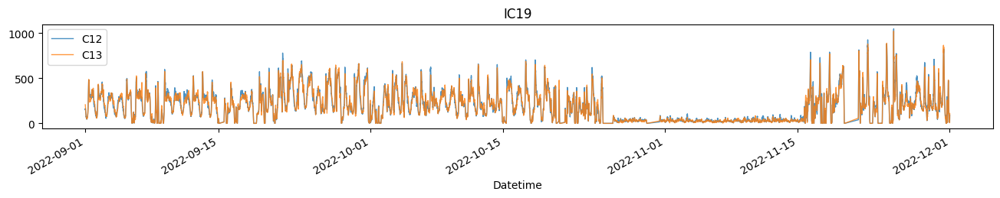

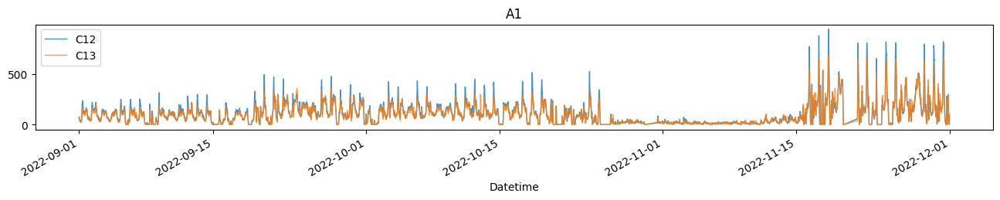

...

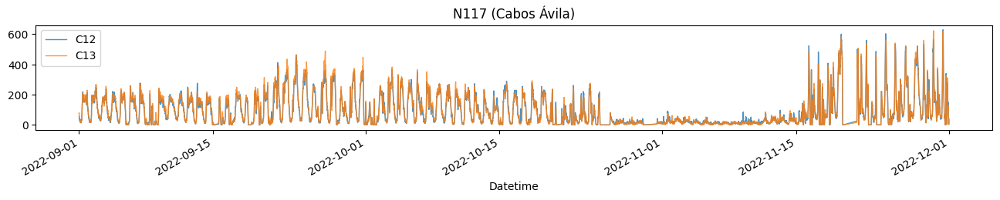

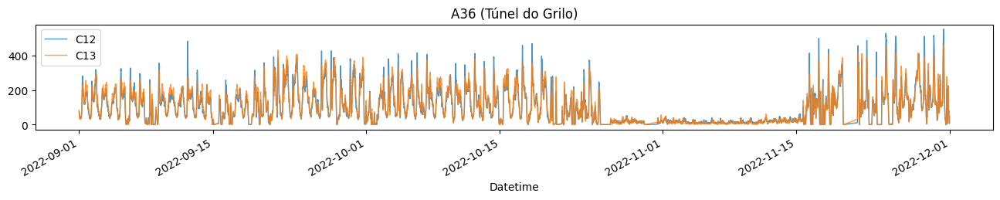

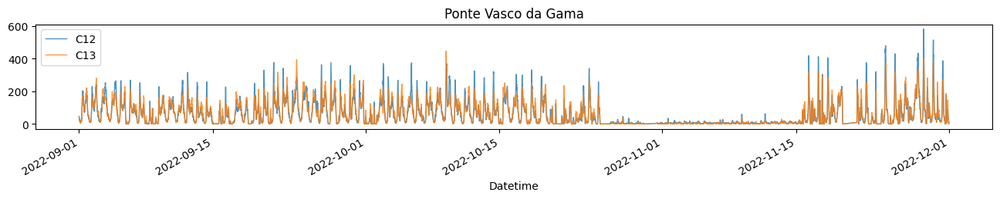

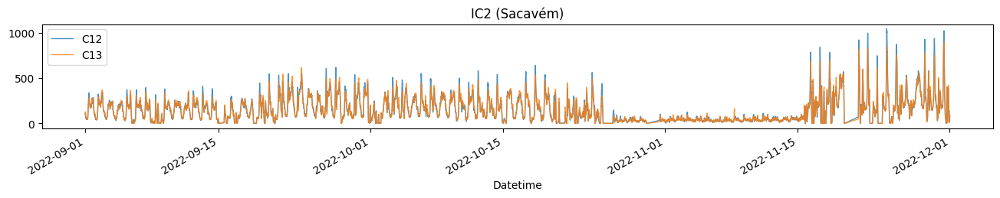

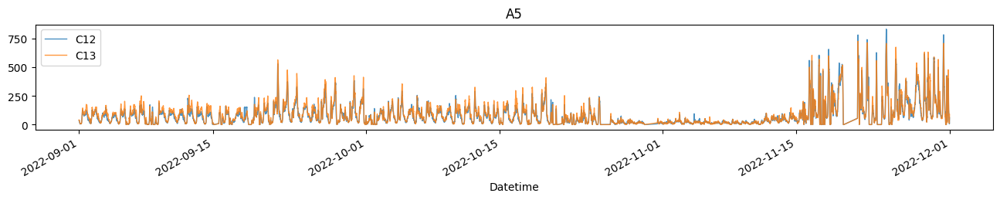

In [37]:
df_axis_metrics_filled = df_axis_metrics.merge(
    pd.Series(pd.date_range(start=df_axis_metrics["Datetime"].min(), end=df_axis_metrics["Datetime"].max(), freq="15T")).to_frame("Datetime"),
    how="outer",
    on=["Datetime"]
)
df_axis_metrics_filtered = df_axis_metrics_filled[
    (df_axis_metrics_filled["Datetime"]>="2022-11-07") &
    (df_axis_metrics_filled["Datetime"]<"2022-11-15")
]

for eixo in df_axis_metrics_filled.loc[~df_axis_metrics_filled["Eixo"].isna(), "Eixo"].unique():
    df_axis_metrics_filled[
        df_axis_metrics_filled["Eixo"] == eixo
    ].set_index("Datetime").sort_index()[["C12", "C13"]].rolling(window=16).mean().plot(
        figsize=(16,2),
        title=eixo,
        lw=1,
        alpha=0.8
    );

##### Conclusion

There are a lot of odd behaviours shown above, together with the overall discrepancies in global aggregations, it makes little to no sense to use this dataset as it is. While it looks like there is useful information in the dataset, cleaning it doesn't seem to be a reasonable task, even with aditional information from other data sources.

#### EMEL - Traffic conditioning

In [38]:
def pd_to_gpd(df, geo_col):
    """
    Converts a Pandas dataframe with a columns containing a GeoJSON into a GeoPandas DataFrame
    
    Params:
      df : DataFrame
      geo_col: Column name with the GeoJSON entries (will be dropped)
    
    Returns:
      GeoPandas DataFrame with the rest of the columns as data entries
    """
    return gpd.GeoDataFrame(
        df.assign(
            geometry=[
                (gpd.read_file(io.BytesIO(positions.encode('utf8'))).geometry.values[0] if isinstance(positions, str) else None)
                for positions in df[geo_col]
            ]
        ).drop(columns=[geo_col]),
        geometry="geometry"
    )

In [39]:
traffic_conditioning_file = os.path.join(data_path, "lisbon_ficheiros_WDL/ficheiros_WDL/CONDICIONAMENTOS TRANSITO/CONDICIONAMENTOS TRANSITO_Set_Out_Nov2022.csv")

In [40]:
df_traffic_cond = pd.read_csv(traffic_conditioning_file)
df_traffic_cond["creation_date"] = pd.to_datetime(df_traffic_cond["creation_date"])

In [41]:
df_traffic_cond

,creation_date,entity_id,position,impacto,morada,motivo,periodos_condicionamentos,restricao_circulacao
0,2022-09-01 08:26:21+00:00,EMEL.condicionamentoTransito.COND-2022-5213-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Pouco relevante,"Rua João Saraiva, n.º 4",OBRA - PASSEIO E ESTACION.,"[{""end_date"":""1664380800000"",""date_min"":""2022-...",Estreitamento de via
1,2022-09-01 08:38:55+00:00,EMEL.condicionamentoTransito.COND-2022-5214-A-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Pouco relevante,"Travessa Henrique Cardoso, n.º 77",OBRA - PASSEIO E ESTACION.,"[{""end_date"":""1664380800000"",""date_min"":""2022-...",Estreitamento de via
2,2022-09-01 08:49:59+00:00,EMEL.condicionamentoTransito.COND-2022-5215-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Relevante,"Rua Ernâni Lopes, {ambos os sentidos}",RESERVA DE ESTACIONAMENTO,"[{""end_date"":""1662498000000"",""date_min"":""2022-...",Estacionamento
3,2022-09-01 08:53:46+00:00,EMEL.condicionamentoTransito.COND-2022-2383-PA-12,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Relevante,"Rua Almeida Brandão, 1| Calçada da Estrela, 75",BETONAGENS/CARGAS DESCARGAS,"[{""end_date"":""1665675000000"",""date_min"":""2022-...",Estreitamento de via
4,2022-09-01 08:54:54+00:00,EMEL.condicionamentoTransito.COND-2022-5216-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Pouco relevante,"Av. da Ucrânia, Marvila",OBRA - PASSEIO E ESTACION.,"[{""end_date"":""1664470800000"",""date_min"":""2022-...",Estreitamento de via
...,...,...,...,...,...,...,...,...
3519,2022-11-30 16:31:16+00:00,EMEL.condicionamentoTransito.COND-2022-7150-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Relevante,"Rua de São Francisco Boirja,35",DESMONTAGEM DE GRUA,"[{""end_date"":""1671386400000"",""date_min"":""2022-...",Corte total
3520,2022-11-30 16:36:15+00:00,EMEL.condicionamentoTransito.COND-2022-7151-A-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Relevante,"Rua Tomás Ribeiro,50",MUDANÇAS,"[{""end_date"":""1671818400000"",""date_min"":""2022-...",Estreitamento de via
3521,2022-11-30 16:38:39+00:00,EMEL.condicionamentoTransito.COND-2022-7152-A-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Pouco relevante,"Rua Castilho, nº 75",MUDANÇAS,"[{""end_date"":""1671818400000"",""date_min"":""2022-...",Estacionamento
3522,2022-11-30 23:43:18+00:00,EMEL.condicionamentoTransito.COND-2022-7154-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Relevante,Praça D. Peo iv#D,MANIFESTAÇÃO,"[{""end_date"":""1671235140000"",""date_min"":""2022-...",Mantém perfil de via


In [42]:
print("Max. number of times a entity_id appears in data:", df_traffic_cond["entity_id"].value_counts().max())

Max. number of times a entity_id appears in data: 1


entity_id is indeed an entity identifier for the traffic conditioning entries

In [43]:
df_traffic_cond["morada"].value_counts()

Praça Dom Pedro IV                                                                    17
Arco da Rua Augusta                                                                   10
Rua do Telhal,72                                                                       8
Rua Sousa Martins, 22 a 24\n                                                           7
Rua do Alecrim,23-25-A/Rua de São Paulo,38-52                                          7
                                                                                      ..
R. Santo António à Estrela 70, 1350-293 Lisboa, Portugal                               1
Rua Quinta da Fonte, nº 25                                                             1
Travessa Moinho do Vento,23 {1 lugar de estacionamento}                                1
iNÍCIO -Reitoria da Cidade Universitária-Campo Grande-Calçada de Carriche e outras     1
Praça D. Peo iv#D                                                                      1
Name: morada, Length:

Morada shows an address, however it shows a lack of standardization and quality that poses a challenge if we try to use it.

In [44]:
df_traffic_cond["motivo"].value_counts()

CARGAS E DESCARGAS/OBRAS                    801
BETONAGENS/CARGAS DESCARGAS                 480
OBRA - FAIXA DE RODAGEM                     221
CARGAS E DESCARGAS                          214
MUDANÇAS                                    209
OBRA - PASSEIO E ESTACION.                  164
FILMAGENS                                   154
RESERVA DE ESTACIONAMENTO                   150
CONCENTRAÇÃO                                119
AUTOGRUA                                    110
LIGAÇÃO DE RAMAL - PASSEIO E ESTACION.      107
PINTURAS                                     99
LIGAÇÃO DE RAMAL - FAIXA DE RODAGEM          91
EVENTO                                       84
PLANTAÇÃO / PODA DE ÁRVORES                  82
BETONAGENS                                   74
MANIFESTAÇÃO                                 65
SUBSTITUIÇÃO DE CAIXA MULTIBANCO             56
ACESSO DE VEÍCULOS À OBRA                    48
OBRAS NO SUBSOLO - FAIXA DE RODAGEM          26
DESMONTAGEM DE GRUA                     

motivo shows a reason for the conditioning, seems to be defined through a set of well defined categories.

In [45]:
df_traffic_cond["restricao_circulacao"].value_counts()

Estreitamento de via    1581
Estacionamento           760
Cortes temporários       409
Passeio                  334
Corte total              211
Mantém perfil de via     206
Corte num sentido         23
Name: restricao_circulacao, dtype: int64

restrição_circulação shows the type of restrition, seems to be defined through a set of well defined categories.

In [46]:
df_traffic_cond["impacto"].value_counts()

Relevante          3075
Pouco relevante     449
Name: impacto, dtype: int64

impacto show the impact of the entry, however it gives little to no insight.

Check positions visually to evaluate if they make sense (this might take a while):

In [47]:
gdf_traffic_cond_positions = pd_to_gpd(df_traffic_cond, "position")

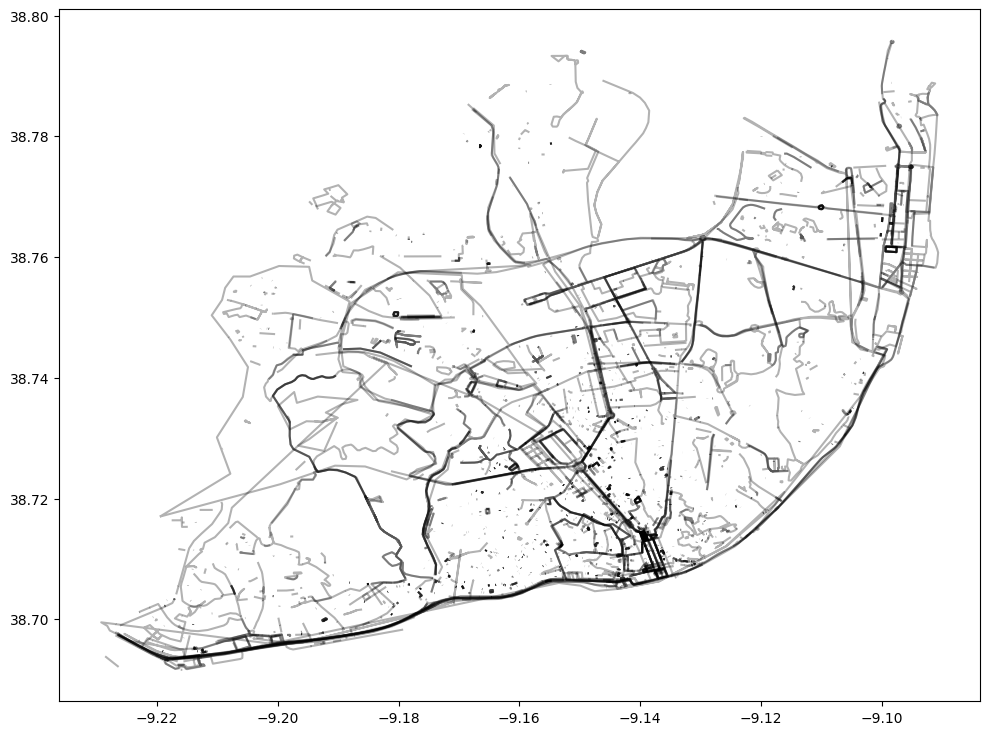

In [48]:
fig, ax = plt.subplots(1,1, figsize=(10,10))

gdf_traffic_cond_positions.plot(ax=ax, color="#000", alpha=0.3)

plt.tight_layout()
plt.show()

For most of the definitions the paths match the roads, there are however a few notable innaccuracies.

Check how are the biggest (in length) paths described:

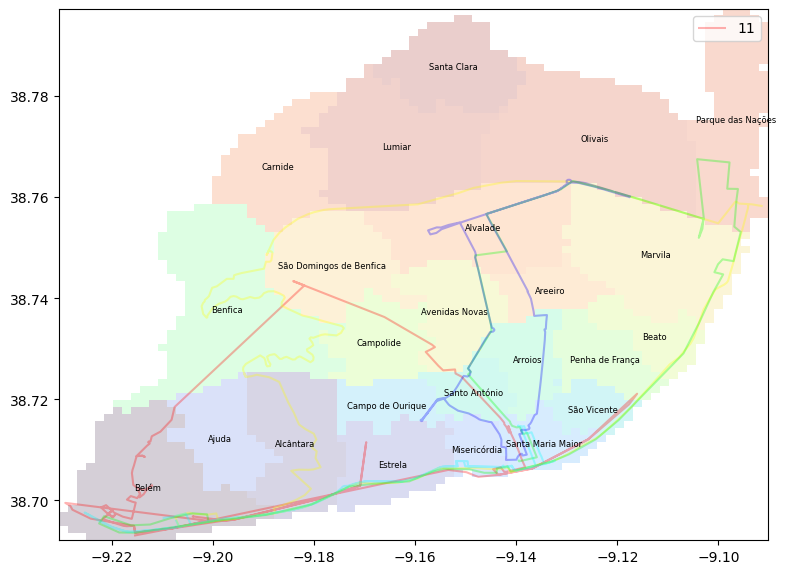

In [49]:
grid_mapping_mask = np.zeros(shape=(len(longitudes), len(latitudes)))
grid_mapping_image = np.zeros(shape=(len(longitudes), len(latitudes), 4))

for lat_idx, latitude in enumerate(latitudes):
    for long_idx, longitude in enumerate(longitudes):
        freguesia = df_grids.loc[
            (df_grids["latitude"] == latitude) &
            (df_grids["longitude"] == longitude),
            "freguesia"
        ].values
        if len(freguesia) == 0:
            grid_mapping_mask[long_idx, lat_idx] = 0
            grid_mapping_image[long_idx, lat_idx] = (0,0,0,0)
        else:
            grid_mapping_mask[long_idx, lat_idx] = 1
            grid_mapping_image[long_idx, lat_idx] = cmap[freguesia[0]]

fig, axs = plt.subplots(1,1,figsize=(8,8), squeeze=False)

axs[0][0].imshow(
    grid_mapping_image.transpose((1,0,2)),
    alpha=0.2,
    origin="lower",
    extent=(
        df_grids["longitude"].min(),
        df_grids["longitude"].max(),
        df_grids["latitude"].min(),
        df_grids["latitude"].max()
    )
)

for row in df_freguesias_centrums.reset_index().itertuples():
    x = long_to_x(row.longitude)
    y = lat_to_y(row.latitude)
    
    axs[0][0].annotate(
        row.freguesia,
        xy=(row.longitude, row.latitude),
        xytext=(row.longitude, row.latitude),
        ha='center', va='center',
        fontsize=6
    )
    
colors = ["#F00", "#FF0", "#0F0", "#0FF", "#00F"]
gdf_traffic_cond_positions.loc[
    gdf_traffic_cond_positions.geometry.map(lambda x: x.length).sort_values(ascending=False).head(5).index,
    :
].plot(ax=axs[0][0], color=colors, alpha=0.3, label=idx);

axs[0][0].set_facecolor('white')

fig.patch.set_facecolor('white')
    
plt.legend()
plt.tight_layout()
plt.show()

This isn't very good, mapping these paths with the actual roads might prove to be a challenge by itself.

For this to be usable we need to map the paths into road segments from a reliable data source, together with waze data this might be useful to predict impacts in traffic when a restriction is imposed.

Lets unfold the dataset periods to check how are the entries defined in time:

In [50]:
# Unfold periodos_condicionamentos:

data = []

p_fields = [
    "end_date",
    "date_min",
    "hour_max",
    "date_max",
    "start_date",
    "hour_min"
]

for row in df_traffic_cond.itertuples():    
    for p in json.loads(row.periodos_condicionamentos):
        data.append(
            tuple(
                [
                    row.Index,
                    row.creation_date,
                    row.entity_id,
                    row.position,
                    row.morada,
                    row.motivo,
                    row.restricao_circulacao,
                    *[p[f] for f in p_fields]
                ]
            )
        )

df_traffic_cond_unfolded = pd.DataFrame(data, columns=[
    "idx", "creation_date", "entity_id", "position", "morada", "motivo", "restricao_circulacao", *p_fields
])

df_traffic_cond_unfolded

,idx,creation_date,entity_id,position,morada,motivo,restricao_circulacao,end_date,date_min,hour_max,date_max,start_date,hour_min
0,0,2022-09-01 08:26:21+00:00,EMEL.condicionamentoTransito.COND-2022-5213-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Rua João Saraiva, n.º 4",OBRA - PASSEIO E ESTACION.,Estreitamento de via,1664380800000,2022-09-15,17:00:00,2022-09-28,1663225200000,08:00:00
1,1,2022-09-01 08:38:55+00:00,EMEL.condicionamentoTransito.COND-2022-5214-A-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Travessa Henrique Cardoso, n.º 77",OBRA - PASSEIO E ESTACION.,Estreitamento de via,1664380800000,2022-09-15,17:00:00,2022-09-28,1663225200000,08:00:00
2,2,2022-09-01 08:49:59+00:00,EMEL.condicionamentoTransito.COND-2022-5215-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Rua Ernâni Lopes, {ambos os sentidos}",RESERVA DE ESTACIONAMENTO,Estacionamento,1662498000000,2022-09-06,22:00:00,2022-09-06,1662451200000,09:00:00
3,3,2022-09-01 08:53:46+00:00,EMEL.condicionamentoTransito.COND-2022-2383-PA-12,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Rua Almeida Brandão, 1| Calçada da Estrela, 75",BETONAGENS/CARGAS DESCARGAS,Estreitamento de via,1665675000000,2022-09-30,16:30:00,2022-10-13,1664528400000,10:00:00
4,4,2022-09-01 08:54:54+00:00,EMEL.condicionamentoTransito.COND-2022-5216-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Av. da Ucrânia, Marvila",OBRA - PASSEIO E ESTACION.,Estreitamento de via,1664470800000,2022-09-27,18:00:00,2022-09-29,1664265600000,09:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3876,3519,2022-11-30 16:31:16+00:00,EMEL.condicionamentoTransito.COND-2022-7150-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Rua de São Francisco Boirja,35",DESMONTAGEM DE GRUA,Corte total,1671386400000,2022-12-17,18:00:00,2022-12-18,1671264000000,08:00:00
3877,3520,2022-11-30 16:36:15+00:00,EMEL.condicionamentoTransito.COND-2022-7151-A-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Rua Tomás Ribeiro,50",MUDANÇAS,Estreitamento de via,1671818400000,2022-12-19,18:00:00,2022-12-23,1671436800000,08:00:00
3878,3521,2022-11-30 16:38:39+00:00,EMEL.condicionamentoTransito.COND-2022-7152-A-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...","Rua Castilho, nº 75",MUDANÇAS,Estacionamento,1671818400000,2022-12-19,18:00:00,2022-12-23,1671436800000,08:00:00
3879,3522,2022-11-30 23:43:18+00:00,EMEL.condicionamentoTransito.COND-2022-7154-1,"{""type"":""GeometryCollection"",""geometries"":[{""c...",Praça D. Peo iv#D,MANIFESTAÇÃO,Mantém perfil de via,1671235140000,2022-12-16,23:59:00,2022-12-16,1671210000000,17:00:00


Lets look at idx 1069 (red path in the map above) to perceive is there is some sort of split in the defined path:

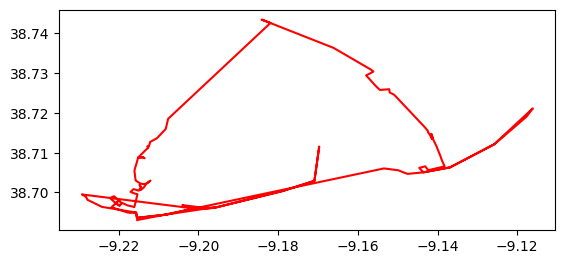

In [51]:
gdf_traffic_cond_positions.loc[[1069],:].plot(color="#F00");

In [52]:
for multi_line in gdf_traffic_cond_positions.geometry[1069].geoms:
    for line in multi_line.geoms:
        print("Line points:", len(line.coords))

Line points: 126


Only a single line is defined, this means that not only the path has poor quality (long straight lines that don't properly match the roads) but it is quite likely that segments are overlapping (as this specific path has blind alleys/dead-ends)

Also note that we couldn't find race events, marathons or other similar entries that could match the 2022-10-02 described, since the path feels quite long, it is rather odd that nothing is noted in any race related websites. The restrictions could be done to evaluate the path conditions prior to the event itself, but as it dwells into `Benfica` parish it feels odd not matching existing paths and roads. This is not the only path showing issues.

For reference, EDP Maratona de Lisboa 2022 was at 2022/10/09.

##### Conclusion

The information appears to be quite usable, matching it with the other data sources is needed to extract value from it might be a challenge on itself. When looking into the details of the exposed data, some entries feel questionable, a domain expert could probably confirm if the entries are correct or some mistakes exist.

While the paths are the best bet to match with other data sources, the low precision of some of them might cause problems.

#### Waze - Traffic

In [53]:
waze_files = [
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_1.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_2.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_3.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_4.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Out2022/CML_waze_jams_102022_1.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Out2022/CML_waze_jams_102022_2.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Nov2022/CML_waze_jams_112022_1.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Nov2022/CML_waze_jams_112022_2.csv",
    "lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Nov2022/CML_waze_jams_112022_3.csv"
]

In [54]:
df_waze_2022_09 = pd.concat([pd.read_csv(os.path.join(data_path, f)) for f in waze_files[:4]])
df_waze_2022_10 = pd.concat([pd.read_csv(os.path.join(data_path, f)) for f in waze_files[4:6]])
df_waze_2022_11 = pd.concat([pd.read_csv(os.path.join(data_path, f)) for f in waze_files[6:]])

df_waze_2022_09["entity_ts"] = pd.to_datetime(df_waze_2022_09["entity_ts"]).dt.tz_localize(None)
df_waze_2022_10["entity_ts"] = pd.to_datetime(df_waze_2022_10["entity_ts"]).dt.tz_localize(None)
df_waze_2022_11["entity_ts"] = pd.to_datetime(df_waze_2022_11["entity_ts"]).dt.tz_localize(None)

It was stated in the provided documentation that an *"inconsistency in the structure of the data"* exists, however we couldn't find anything notable.

In [55]:
df_waze_2022_09.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2176027 entries, 0 to 325329
Data columns (total 8 columns):
 #   Column     Dtype         
---  ------     -----         
 0   entity_ts  datetime64[ns]
 1   entity_id  object        
 2   street     object        
 3   position   object        
 4   level      float64       
 5   length     float64       
 6   delay      float64       
 7   speed      float64       
dtypes: datetime64[ns](1), float64(4), object(3)
memory usage: 149.4+ MB


In [56]:
df_waze_2022_10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 931877 entries, 0 to 369562
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   entity_ts  931877 non-null  datetime64[ns]
 1   entity_id  931877 non-null  object        
 2   street     744159 non-null  object        
 3   position   931760 non-null  object        
 4   level      931760 non-null  float64       
 5   length     931760 non-null  float64       
 6   delay      931760 non-null  float64       
 7   speed      931877 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(3)
memory usage: 64.0+ MB


In [57]:
df_waze_2022_11.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1389020 entries, 0 to 372770
Data columns (total 8 columns):
 #   Column     Non-Null Count    Dtype         
---  ------     --------------    -----         
 0   entity_ts  1389020 non-null  datetime64[ns]
 1   entity_id  1389020 non-null  object        
 2   street     1122595 non-null  object        
 3   position   1389016 non-null  object        
 4   level      1389016 non-null  float64       
 5   length     1389016 non-null  float64       
 6   delay      1389016 non-null  float64       
 7   speed      1389020 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(3)
memory usage: 95.4+ MB


Checking the nulls in the street:

In [58]:
df_waze_2022_09["street"].value_counts(dropna=False)

NaN                             392233
R. Melo Antunes                 123249
Av. 24 de Julho                 112388
Eixo Central                     82590
R. da Tabaqueira                 82134
                                 ...  
R. António Aleixo                    2
R. das Mirandas                      2
Ac. 1, Pç. de Espanha A2 {S}         2
Cç. Bento da Rocha Cabral            2
R. Cristovão de Figueiredo           2
Name: street, Length: 2187, dtype: int64

In [59]:
df_waze_2022_11["street"].value_counts(dropna=False)

NaN                                       266425
R. Melo Antunes                            60699
Av. 24 de Julho                            54680
Al. dos Oceanos                            41020
Eixo Central                               40989
                                           ...  
Ac. 2, Alfragide, Zn. Industrial, EMFA         2
R. Heróis do Ultramar                          2
R. Julieta Ferrão                              2
R. Corino de Andrade                           2
R. de S. Miguel                                2
Name: street, Length: 2202, dtype: int64

Given the amount of nulls, the street field usability might be limited.

In [60]:
df_waze_2022_10["level"].value_counts(dropna=False)

5.0    540715
3.0    183863
4.0    134213
2.0     63663
1.0      9306
NaN       117
Name: level, dtype: int64

We have a couple of nulls in the level, if we need to use this data, we might have to discard these entries, as there are only a few, it shouldn't be an issue.

In [61]:
(df_waze_2022_10["length"].isna() & df_waze_2022_10["level"].isna() & df_waze_2022_10["delay"].isna()).sum()

117

In [62]:
df_waze_2022_10["speed"].isna().sum()

0

In [63]:
print("Min. Speed:", df_waze_2022_10["speed"].min())
print("Max. Speed:", df_waze_2022_10["speed"].max())

Min. Speed: 0.0
Max. Speed: 17.997222900390625


In [64]:
df_waze_2022_10["delay"].value_counts(dropna=False)

-1.0       540715
 77.0        3939
 78.0        3928
 82.0        3908
 84.0        3861
            ...  
 3260.0         1
 1580.0         1
 1636.0         1
 2572.0         1
 1629.0         1
Name: delay, Length: 1886, dtype: int64

A lot of entries for blockages.

In [65]:
df_waze_2022_10["speed"].value_counts(dropna=False)

0.000000     540832
1.041667        699
1.316667        628
1.302778        561
1.241667        540
              ...  
11.558333         1
10.022223         1
11.675000         1
9.850000          1
9.186111          1
Name: speed, Length: 4491, dtype: int64

A lot of entries with speed zero, matches the magnitude of the blockages.

Plot the paths to verify if they map lisbon roads:

In [66]:
def get_biggest(x):
    s = x.str.len()
    return x[s == s.max()].head(1).values[0]

df_waze_2022_09_positions = df_waze_2022_09.groupby(["street"]).agg({"position": get_biggest})["position"]
df_waze_2022_10_positions = df_waze_2022_10.groupby(["street"]).agg({"position": get_biggest})["position"]
df_waze_2022_11_positions = df_waze_2022_11.groupby(["street"]).agg({"position": get_biggest})["position"]

In [67]:
print("Largest streets 2022-09:", len(df_waze_2022_09_positions))
print("Largest streets 2022-10:", len(df_waze_2022_10_positions))
print("Largest streets 2022-11:", len(df_waze_2022_11_positions))

Largest streets 2022-09: 2186
Largest streets 2022-10: 2017
Largest streets 2022-11: 2201


In [68]:
gdf_waze_2022_09_positions = pd_to_gpd(df_waze_2022_09_positions.to_frame().reset_index(), "position")
gdf_waze_2022_10_positions = pd_to_gpd(df_waze_2022_10_positions.to_frame().reset_index(), "position")
gdf_waze_2022_11_positions = pd_to_gpd(df_waze_2022_11_positions.to_frame().reset_index(), "position")

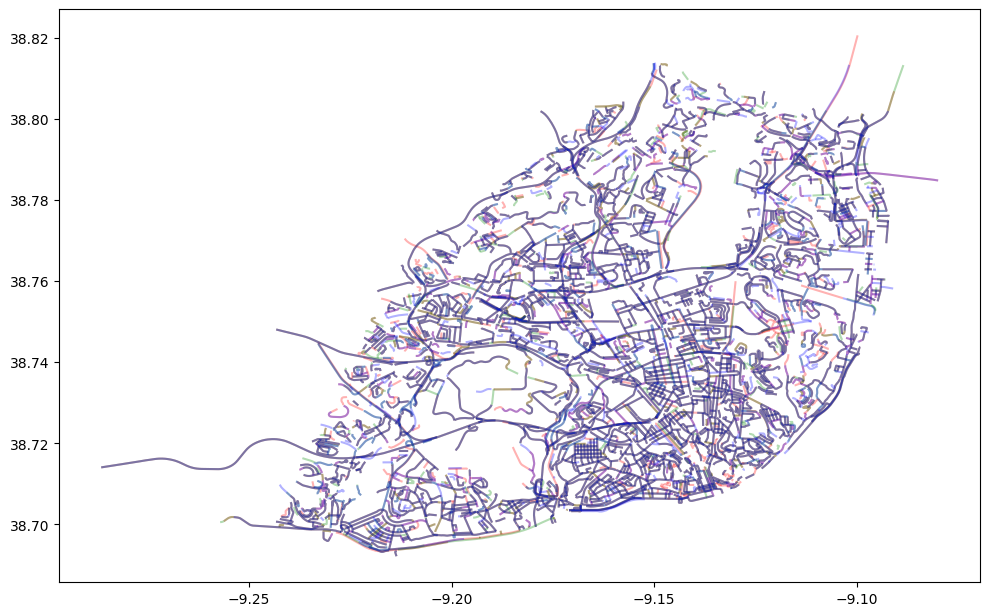

In [69]:
fig, axs = plt.subplots(1,1,figsize=(10,10), squeeze=False)

gdf_waze_2022_09_positions.plot(ax=axs[0][0], color="#F00", alpha=0.3)
gdf_waze_2022_10_positions.plot(ax=axs[0][0], color="#080", alpha=0.3)
gdf_waze_2022_11_positions.plot(ax=axs[0][0], color="#00F", alpha=0.3)

plt.tight_layout()
plt.show()

##### Conclusion

The are slight discrepancies in the paths described in the Waze dataset, there are some overlaps in the paths and streets descibed by the dataset, overall it seems to be okay to join this with other data sources though geographic coordinates.

#### CML_REDE VIÁRIA

Sadly we didn't have time to use this data, from a quick overview on the webservice, it should provide a good ground truth to the road network, however it is provided as a single time snapshot, thus, any past road works that might have changed the roads and paths might cause mismatches in the current data.

### EDA

#### Geographic points of interest

To better understand where people move to/from, we gathered a few points of interest that might be useful when exploring the data spatially:

In [70]:
poi_locations = [
    {
        "name": "Estádio José Alvalade",
        "latitude": 38.76120877321172,
        "longitude": -9.160930365935483
    },
    {
        "name": "Airport Business Center",
        "latitude": 38.76959061618445,
        "longitude": -9.128955202832783
    },
    {
        "name": "Terminal de Carga Aérea",
        "latitude": 38.772314324668464, 
        "longitude": -9.145312964281564
    },
    {
        "name": "Terminal de Metro Lisboa",
        "latitude": 38.76581013440303,
        "longitude": -9.150637726411547
    },
    {
        "name": "Centro Comercial Colombo",
        "latitude": 38.75404966221077,
        "longitude": -9.188407519949847
    },
    {
        "name": "Estação do Oriente",
        "latitude": 38.767840062989826,
        "longitude": -9.098942464130495
    },
    {
        "name": "Miradouro do Alto da Serafina",
        "latitude": 38.733464781924084,
        "longitude": -9.176009515365253
    },
    {
        "name": "Greenhouse Hello Park",
        "latitude": 38.73415289422001,
        "longitude": -9.178560607317127
    },
    {
        "name": "Forum Picoas",
        "latitude": 38.73088768979602,
        "longitude": -9.145387742550378
    },
    {
        "name": "Estádio do Sport Lisboa e Benfica",
        "latitude": 38.752660266580506,
        "longitude": -9.184778469532738
    },
    {
        "name": "Praça do Comércio",
        "latitude": 38.707427199297875,
        "longitude": -9.136426052908575
    },
    {
        "name": "Cais do Sodré",
        "latitude": 38.70602300451386,
        "longitude": -9.145679062126993
    },
    {
        "name": "Praça Luis de Camões",
        "latitude": 38.71059672375898,
        "longitude": -9.143476344958035
    },
    {
        "name": "Elevador de Santa Justa",
        "latitude": 38.71210106084461,
        "longitude": -9.1394558381677
    },
    {
        "name": "Sé de Lisboa",
        "latitude": 38.709887620959215,
        "longitude": -9.132584777056408
    },
    {
        "name": "Hospital de S. José",
        "latitude": 38.71792888519709,
        "longitude": -9.137472710977582
    },
    {
        "name": "Estação de Sta. Apolónia",
        "latitude": 38.714146085538694,
        "longitude": -9.122592941099446
    },
    {
        "name": "Subway Intendente",
        "latitude": 38.72223953493625,
        "longitude": -9.135332489313305
    },
    {
        "name": "Panteão Nacional",
        "latitude": 38.71499357282271,
        "longitude": -9.124628876248227
    },
    {
        "name": "Subway Rato",
        "latitude": 38.720098648916895,
        "longitude": -9.154063460985569
    },
    {
        "name": "Subway Avenida",
        "latitude": 38.72010975666967,
        "longitude": -9.14583182781338
    }
]

#### Grid Cells Data

The grid data has several counters has shown in the metadata documentation (see appendix for the details), from those we created a few metrics that we though to be useful to extract insights from this data.

Having:

$C_5 = \text{Number of different terminal entries in the grid}$

$C_6 = \text{Number of different terminal outputs in the grid}$

We define:

$\text{High flow heuristic} = \frac{max(C_5,\ C_6)}{abs(C_5 - C_6) + 1}$ → Shows the through flow (in and out)

$\text{Sink} = max(C_5 - C_6, 0)$ → Shows how much more terminals are entering the cell than exiting

$\text{Source} = max(C_6 - C_5, 0)$ → Shows how much more terminals are entering the cell than exiting


In [71]:
df_dispositivos["high_flow_heuristic"] = (df_dispositivos[["C5", "C6"]].max(axis=1) / ((df_dispositivos["C5"] - df_dispositivos["C6"]).abs() + 1))
df_dispositivos["sink"] = (df_dispositivos["C5"] - df_dispositivos["C6"]).apply(lambda x: 0 if x<0 else x)
df_dispositivos["source"] = (df_dispositivos["C6"] - df_dispositivos["C5"]).apply(lambda x: 0 if x<0 else x)
df_dispositivos["day_of_week"] = df_dispositivos["Datetime"].dt.day_of_week

In [72]:
df_agg_data = df_dispositivos.groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

In [73]:
def create_grid_map(df_agg, col):
    """
        Creates a matrix with the grid data in latitude and longitude indexes.
        
        Params:
          df_agg : DataFrame, aggregated at grid_id level, with lat_idx, long_idx columns
          col : Column to pick the values used in the grid matrix
          
        returns a numpy matrix with shape (nbr. latitudes, nbr. longitudes)
    """
    grid_mapping_image = np.zeros(shape=(len(latitudes), len(longitudes)))

    for lat_idx, latitude in enumerate(latitudes):
        for long_idx, longitude in enumerate(longitudes):
            data = df_agg.loc[
                (df_agg["lat_idx"] == lat_idx) &
                (df_agg["long_idx"] == long_idx),
                col
            ].values
            if len(data) == 0:
                grid_mapping_image[lat_idx, long_idx] = np.nan
            else:
                grid_mapping_image[lat_idx, long_idx] = data

    return grid_mapping_image

def plot_grid_map(
            grid_map,
            ax,
            extent=(
                longitudes.min()-(longitudes.max()-longitudes.min())/len(longitudes)/2,
                longitudes.max()-(longitudes.max()-longitudes.min())/len(longitudes)/2,
                latitudes.min()-(latitudes.max()-latitudes.min())/len(latitudes)/2,
                latitudes.max()-(latitudes.max()-latitudes.min())/len(latitudes)/2
            ),
            **kwargs 
        ):
    """
    Plot a grid map in a matplotlib plotly axis instance
    
    Params:
      grid_map : numpy matrix
      ax : matplotlib plotly axis instance
      extent : axis value extent mapping for the grid
      **kwargs : keyword arguments to pass to imshow() call
      
    returns imshow() image result
    """
    im = ax.imshow(
        grid_map,
        alpha=1,
        origin="lower",
        extent=extent,
        **kwargs
    )
    
    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("", rotation=-90, va="center")

    return im

def log_normalize_grid(grid):
    """
    Normalizes the grid values by using the expression:
    log(v / max + 1)
    
    Params:
      grid : numpy grid matrix
    
    Returns a new matrix with the normalized values
    """
    return np.log(grid/np.nanmax(grid) + 1)

def plot_points_of_interest(pois, ax, offsets=None):
    for i, p in enumerate(pois):
        poi = list(filter(lambda x: p==x["name"], poi_locations))
        if len(poi) == 1:
            poi = poi[0]
            ax.plot([poi["longitude"]], [poi["latitude"]], marker='x', label=poi["name"])

            ann = ax.annotate(
                poi["name"],
                xy=(poi["longitude"], poi["latitude"]),
                xycoords='data',
                xytext=(
                    poi["longitude"]+(0.005 if offsets is None else offsets[i][0]),
                    poi["latitude"]+(0.005 if offsets is None else offsets[i][0])
                ),
                textcoords='data',
                size=6, va="center", ha="center",
                bbox=dict(boxstyle="round4", fc="w"),
                arrowprops=dict(
                    arrowstyle="-|>",
                    connectionstyle="arc3,rad=-0.2",
                    fc="w"
                )
            )

In [74]:
# Waze Level colors map:
level_colors = {
    0: "#0F0",
    1: "#4F0",
    2: "#4C0",
    3: "#880",
    4: "#C40",
    5: "#F00",
}

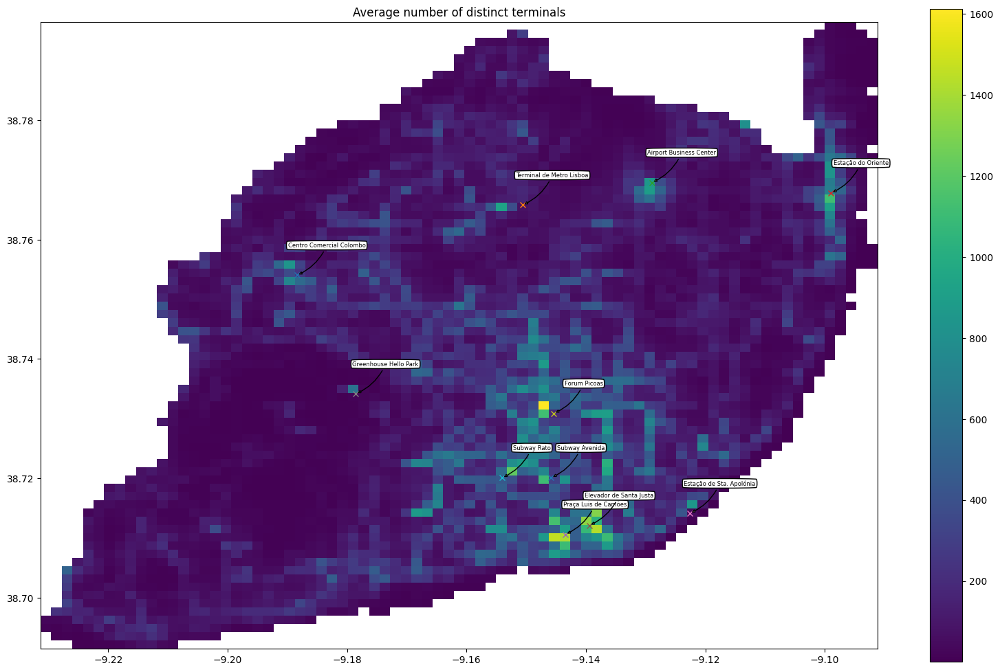

In [75]:
grid_mapping_image = create_grid_map(df_agg_data, "C3")
    
fig, axs = plt.subplots(1,1,figsize=(16,10), squeeze=False)

im = plot_grid_map(grid_mapping_image, axs[0][0])

plot_points_of_interest(
    [
        "Centro Comercial Colombo",
        "Terminal de Metro Lisboa",
        "Airport Business Center",
        "Estação do Oriente",
        "Praça Luis de Camões",
        "Elevador de Santa Justa",
        "Estação de Sta. Apolónia",
        "Greenhouse Hello Park",
        "Forum Picoas",
        "Subway Rato",
        "Subway Avenida"
    ],
    axs[0][0]
)

axs[0][0].set_title("Average number of distinct terminals")
axs[0][0].set_facecolor('white')

fig.patch.set_facecolor('white')
plt.tight_layout()
plt.savefig("grid_global_distinct_terminals.png")
plt.show()

This overview shows where people spent most of their time when they are in Lisbon.

We can see that Av. Fontes Pereira de Melo and Av. Republica are two of the main road axis that see a lot of movement. This area is filled with comercial buildings, offices, hotels, Maternidade Alfredo da Costa.

At south we see the entertainment and tourism areas are also highlighted.

Transportation related points are also noticeable with the Estação do Orient and Airport.

Comercial areas are also quite popular with the region around Centro Comercial Colombo showing a high number of terminals present in average.


In [76]:
df_agg_data_weekend = df_dispositivos[df_dispositivos["day_of_week"].isin([5,6])].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

df_agg_data_workday = df_dispositivos[df_dispositivos["day_of_week"].isin([0,1,2,3,4])].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

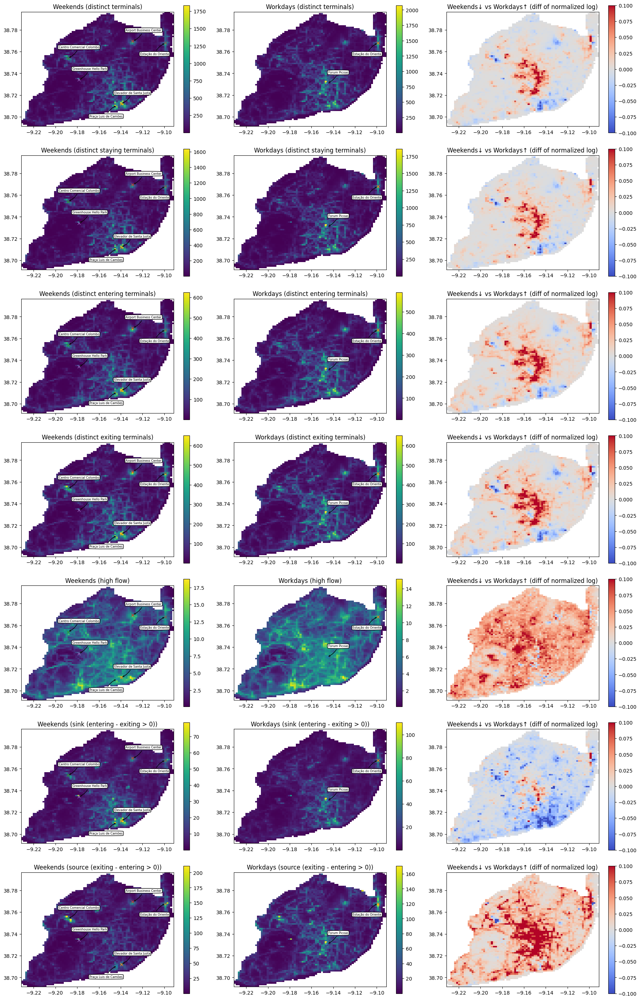

In [77]:
metrics = [
    { "col": "C1", "name": "distinct terminals" },
    { "col": "C3", "name": "distinct staying terminals" },
    { "col": "C5", "name": "distinct entering terminals" },
    { "col": "C6", "name": "distinct exiting terminals" },
    { "col": "high_flow_heuristic", "name": "high flow" },
    { "col": "sink", "name": "sink (entering - exiting > 0)" },
    { "col": "source", "name": "source (exiting - entering > 0)" },
]

fig, axs = plt.subplots(len(metrics),3,figsize=(3*6, 4*len(metrics)), squeeze=False)

for idx, metric in enumerate(metrics):
    
    grid_mapping_image_wend = create_grid_map(df_agg_data_weekend, metric["col"])
    plot_grid_map(grid_mapping_image_wend, axs[idx][0])
    axs[idx][0].set_title("Weekends ({})".format(metric["name"]))

    plot_points_of_interest(
        [
            "Praça Luis de Camões",
            "Elevador de Santa Justa",
            "Centro Comercial Colombo",
            "Airport Business Center",
            "Greenhouse Hello Park",
            "Estação do Oriente"
        ],
        axs[idx][0],
        offsets=[
            (-0.01, 0.01),
            ( 0.01, 0.01),
            ( 0.01, 0.01),
            ( 0.01, 0.01),
            ( 0.01, 0.01),
            (-0.01,-0.01)
        ]
    )
    
    grid_mapping_image_work = create_grid_map(df_agg_data_workday, metric["col"])
    plot_grid_map(grid_mapping_image_work, axs[idx][1])
    axs[idx][1].set_title("Workdays ({})".format(metric["name"]))

    plot_points_of_interest(
        [
            "Forum Picoas",
            "Estação do Oriente"
        ],
        axs[idx][1],
        offsets=[
            (0.01,0.01),
            (-0.01,-0.01)
        ]
    )

    grid_mapping_image = log_normalize_grid(grid_mapping_image_work) - log_normalize_grid(grid_mapping_image_wend)
    grid_mapping_image = np.exp(grid_mapping_image) - 1
    vmax = np.max(grid_mapping_image)
    vmin = np.min(grid_mapping_image)
    lv = np.max([np.abs(vmax), np.abs(vmin)])
    vmax = lv
    vmin = -lv
    plot_grid_map(
        grid_mapping_image,
        axs[idx][2],
        cmap="coolwarm",
        vmin=vmin,
        vmax=vmax
        
    )
    axs[idx][2].set_title("Weekends↓ vs Workdays↑ (diff of normalized log)")

    axs[idx][0].set_facecolor('white')
    axs[idx][1].set_facecolor('white')
    axs[idx][2].set_facecolor('white')

fig.patch.set_facecolor('white')
plt.tight_layout()
plt.savefig("grid_global_weekends.png")
plt.show()

In workdays we see that Av. Fontes Pereira de Melo and Av. Republica are two of the main road axis that see a lot of movement. The surrounding area with commerce, offices, hotels match this pattern.

In the weekends people gravitate towards entertainment and tourism areas. Centro Comercial Colombo and Cais do Sodré show higher relative occupancy that the workdays.

These visualizations could be modified to compare absolute values, use other metrics or focus on other scopes.

Rush hours according to brief: 7:00AM-10:00AM and 5:00PM-8:00PM

In [78]:
df_agg_data_workday_nonrush = df_dispositivos[
    (df_dispositivos["day_of_week"].isin([0,1,2,3,4])) &
    ~(
        (
            (df_dispositivos["Datetime"].dt.hour >= 7) &
            (df_dispositivos["Datetime"].dt.hour < 10)
        ) | (
            (df_dispositivos["Datetime"].dt.hour >= 17) &
            (df_dispositivos["Datetime"].dt.hour < 20)
        )
    )
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

gdf_work_non_rush = pd_to_gpd(
    df_waze_2022_10[
        df_waze_2022_10["entity_ts"].dt.day_of_week.isin([0,1,2,3,4]) &
        ~(
            (
                (df_waze_2022_10["entity_ts"].dt.hour >= 7) &
                (df_waze_2022_10["entity_ts"].dt.hour < 10)
            ) | (
                (df_waze_2022_10["entity_ts"].dt.hour >= 17) &
                (df_waze_2022_10["entity_ts"].dt.hour < 20)
            )
        )
    ].groupby(["street"]).agg({"position": get_biggest, "level": "median"}).reset_index(),
    "position"
)

In [79]:
df_agg_data_workday_morning_rush = df_dispositivos[
    (df_dispositivos["day_of_week"].isin([0,1,2,3,4])) & 
    (
        (df_dispositivos["Datetime"].dt.hour >= 7) &
        (df_dispositivos["Datetime"].dt.hour < 10)
    )
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

gdf_work_morning_rush = pd_to_gpd(
    df_waze_2022_10[
        df_waze_2022_10["entity_ts"].dt.day_of_week.isin([0,1,2,3,4]) &
        (
            (df_waze_2022_10["entity_ts"].dt.hour >= 7) &
            (df_waze_2022_10["entity_ts"].dt.hour < 10)
        )
    ].groupby(["street"]).agg({"position": get_biggest, "level": "median"}).reset_index(),
    "position"
)

In [80]:
df_agg_data_workday_afternoon_rush = df_dispositivos[
    (df_dispositivos["day_of_week"].isin([0,1,2,3,4])) &
    (
        (df_dispositivos["Datetime"].dt.hour >= 17) &
        (df_dispositivos["Datetime"].dt.hour < 20)
    )
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

gdf_work_afternoon_rush = pd_to_gpd(
    df_waze_2022_10[
        df_waze_2022_10["entity_ts"].dt.day_of_week.isin([0,1,2,3,4]) &
        (
            (df_waze_2022_10["entity_ts"].dt.hour >= 17) &
            (df_waze_2022_10["entity_ts"].dt.hour < 20)
        )
    ].groupby(["street"]).agg({"position": get_biggest, "level": "median"}).reset_index(),
    "position"
)

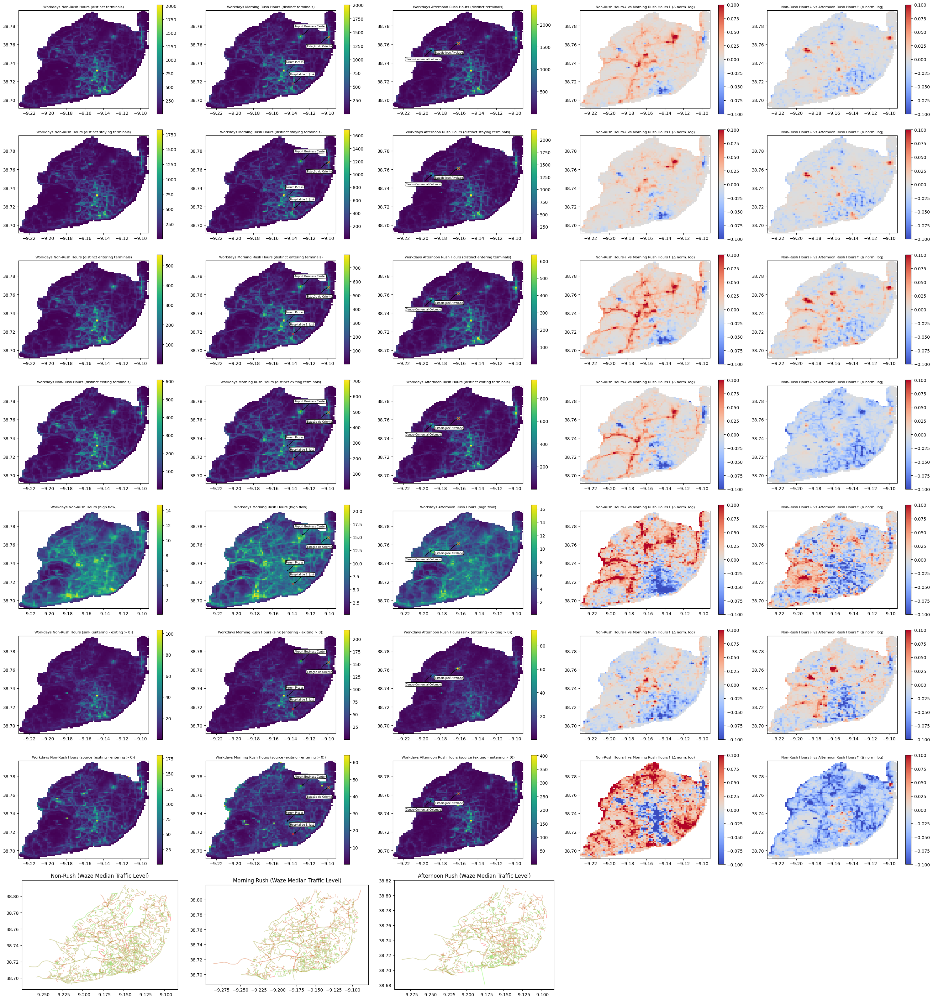

In [81]:
metrics = [
    { "col": "C1", "name": "distinct terminals" },
    { "col": "C3", "name": "distinct staying terminals" },
    { "col": "C5", "name": "distinct entering terminals" },
    { "col": "C6", "name": "distinct exiting terminals" },
    { "col": "high_flow_heuristic", "name": "high flow" },
    { "col": "sink", "name": "sink (entering - exiting > 0)" },
    { "col": "source", "name": "source (exiting - entering > 0)" },
]

fig, axs = plt.subplots(len(metrics)+1,5,figsize=(5*6, 4*(len(metrics)+1)), squeeze=False)

title_fontdict = {
    "fontsize": 8
}

for idx, metric in enumerate(metrics):
    
    grid_mapping_image_nonrush = create_grid_map(df_agg_data_workday_nonrush, metric["col"])
    plot_grid_map(grid_mapping_image_nonrush, axs[idx][0])
    axs[idx][0].set_title("Workdays Non-Rush Hours ({})".format(metric["name"]), fontdict=title_fontdict)

    grid_mapping_image_morning_rush = create_grid_map(df_agg_data_workday_morning_rush, metric["col"])
    plot_grid_map(grid_mapping_image_morning_rush, axs[idx][1])
    axs[idx][1].set_title("Workdays Morning Rush Hours ({})".format(metric["name"]), fontdict=title_fontdict)

    plot_points_of_interest(
        [
            "Forum Picoas",
            "Estação do Oriente",
            "Airport Business Center",
            "Hospital de S. José"
        ],
        axs[idx][1],
        offsets=[
            (0.01,0.01),
            (-0.01,-0.01),
            (0.01,0.01),
            (0.01,0.01),
        ]
    )

    
    grid_mapping_image_afternoon_rush = create_grid_map(df_agg_data_workday_afternoon_rush, metric["col"])
    plot_grid_map(grid_mapping_image_afternoon_rush, axs[idx][2])
    axs[idx][2].set_title("Workdays Afternoon Rush Hours ({})".format(metric["name"]), fontdict=title_fontdict)

    plot_points_of_interest(
        [
            "Centro Comercial Colombo",
            "Estádio José Alvalade"
        ],
        axs[idx][2],
        offsets=[
            (-0.01,-0.01),
            (-0.01,-0.01)
        ]
    )

    
    grid_mapping_image = log_normalize_grid(grid_mapping_image_morning_rush) - log_normalize_grid(grid_mapping_image_nonrush)
    grid_mapping_image = np.exp(grid_mapping_image) - 1
    vmax = np.max(grid_mapping_image)
    vmin = np.min(grid_mapping_image)
    lv = np.max([np.abs(vmax), np.abs(vmin)])
    vmax = lv
    vmin = -lv
    plot_grid_map(
        grid_mapping_image,
        axs[idx][3],
        cmap="coolwarm",
        vmin=vmin,
        vmax=vmax
        
    )
    axs[idx][3].set_title("Non-Rush Hours↓ vs Morning Rush Hours↑ (Δ norm. log)", fontdict=title_fontdict)

    grid_mapping_image = log_normalize_grid(grid_mapping_image_afternoon_rush) - log_normalize_grid(grid_mapping_image_nonrush)
    grid_mapping_image = np.exp(grid_mapping_image) - 1
    vmax = np.max(grid_mapping_image)
    vmin = np.min(grid_mapping_image)
    lv = np.max([np.abs(vmax), np.abs(vmin)])
    vmax = lv
    vmin = -lv
    plot_grid_map(
        grid_mapping_image,
        axs[idx][4],
        cmap="coolwarm",
        vmin=vmin,
        vmax=vmax
        
    )
    axs[idx][4].set_title("Non-Rush Hours↓ vs Afternoon Rush Hours↑ (Δ norm. log)", fontdict=title_fontdict)

gdf_work_non_rush.plot(ax=axs[len(metrics)][0], color=gdf_work_non_rush["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][0].set_title("Non-Rush (Waze Median Traffic Level)")

gdf_work_morning_rush.plot(ax=axs[len(metrics)][1], color=gdf_work_morning_rush["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][1].set_title("Morning Rush (Waze Median Traffic Level)")

gdf_work_afternoon_rush.plot(ax=axs[len(metrics)][2], color=gdf_work_afternoon_rush["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][2].set_title("Afternoon Rush (Waze Median Traffic Level)")

axs[len(metrics)][3].axis('off')
axs[len(metrics)][4].axis('off')
    
plt.tight_layout()
plt.show()

This visualization carries a lot of information, but you can perceive point of interest and roads taken, in the mornings the flow heuristic shows an higher rate than in the afternoon.

We can see that the Airport is more active during the mornings, but the Centro Comercial Colombo is less visited during this time.

In contrast during the afternoon rush hours more people go to the Colombo mall and Oriente Station.

#### Events

In [82]:
provided_events = [
    {
        "Description": "Strike - Metropolitano de Lisboa",
        "Times": [datetime(2022, 10, 25)],
        "Locations": None
    },
    {
        "Description": "Strike - C.P.",
        "Times": [
            datetime(2022, 10, 31),
            datetime(2022, 11,  2),
            datetime(2022, 12, 23),
            datetime(2022, 12, 25),
            datetime(2022, 12, 26)
        ],
        "Locations": None
    },
    {
        "Description": "Strike - Public Services and Teachers",
        "Times": [
            datetime(2022, 11, 18)
        ],
        "Locations": None
    },
    {
        "Description": "Teachers' Concentration near the Republic Assembly",
        "Times": [
            datetime(2022, 11, 25)
        ],
        "Locations": None
    },
    {
        "Description": "Strike - Metropolitan Bus Company",
        "Times": [
            datetime(2022, 10,  3)
        ],
        "Locations": None
    },
    {
        "Description": "Holiday and Comemorative Ceremony for the Implantation of the Republic (Praça do Munícipio)",
        "Times": [
            datetime(2022, 10,  5)
        ],
        "Locations": None
    },
    {
        "Description": "Lisbon Marathon",
        "Times": [
            datetime(2022, 10,  9)
        ],
        "Locations": None    
    },
    {
        "Description": "Web Summit",
        "Times": [
            datetime(2022, 11,  1),
            datetime(2022, 11,  2),
            datetime(2022, 11,  3),
            datetime(2022, 11,  4)
        ],
        "Locations": [{
            "latitude": 38.7717357,
            "longitude": -9.0932426
        }]
    },
    {
        "Description": "International matches at Alvalade Stadium",
        "Times": [
            datetime(2022,  9, 13, 17, 45),  # Sporting - Tottenham
            datetime(2022, 10, 12, 20,  0),  # Sporting - Marseille
            datetime(2022, 11,  1, 20,  0),  # Sporting - Eintracht Frankfurt
            datetime(2022, 11, 17, 18, 45),  # Portugal - Nigéria
        ],
        "Locations": [{
            "latitude": 38.7612299,
            "longitude": -9.1617956
        }]
    },
    {
        "Description": "National matches at Alvalade Stadium",
        "Times": [
            datetime(2022,  9, 10, 18,  0),  # Sporting - Portimonense
            datetime(2022,  9, 30, 19,  0),  # Sporting - Gil Vicente
            datetime(2022, 10, 22, 20, 30),  # Sporting - Casa Pia AC
            datetime(2022, 11,  5, 20, 30),  # Sporting - Victória SC 
            datetime(2022, 11, 30, 20, 45),  # Sporting - Farense
            datetime(2022, 12, 13, 20, 45),  # Sporting - Marítimo
            datetime(2022, 12, 19, 20, 15)   # Sporting - SC Braga
        ],
        "Locations": [{
            "latitude": 38.7612299,
            "longitude": -9.1617956
        }]
    },
    {
        "Description": "International matches at Luz Stadium",
        "Times": [
            datetime(2022,  9,  6, 20,  0), # Benfica - Maccabi Haifa
            datetime(2022, 10,  5, 20,  0), # Benfica - Paris SG
            datetime(2022, 10, 25, 20,  0)  # Benfica - Juventus
        ],
        "Locations": [{
            "latitude": 38.7527095,
            "longitude": -9.1848897
        }]
    },
    {
        "Description": "National matches at Luz Stadium",
        "Times": [
            datetime(2022,  9,  2, 19,  0), # Benfica - FC Vizela
            datetime(2022,  9, 18, 18,  0), # Benfica - Marítimo
            datetime(2022, 10,  8, 18,  0), # Benfica - Rio Ave
            datetime(2022, 10, 29, 18,  0), # Benfica - GD Chaves
            datetime(2022, 11, 13, 18,  0), # Benfica - Gil Vicente
            datetime(2022, 11, 26, 20, 45)  # Benfica - FC Penafiel
        ],
        "Locations": [{
            "latitude": 38.7527095,
            "longitude": -9.1848897
        }]
    },
    {
        "Description": "Heavy rainfall events gave rise to flash floods in several urban areas of the city of Lisbon",
        "Times": [
            datetime(2022, 12, 7),
            datetime(2022, 12, 8),
            datetime(2022, 12, 12),
            datetime(2022, 12, 13)
        ],
        "Locations": None
    },
    {
        "Description": "New Year's Eve Party in Terreiro do Paço/Praça do Comércio",
        "Times": [
            datetime(2022, 12, 31)
        ],
        "Locations": None
    }
]

In [83]:
november_events = []
for event in provided_events:
    times = [t for t in event["Times"] if t >= datetime(2022, 11, 1) and t < datetime(2022, 11, 15)]
    if len(times) == 0:
        continue
    november_events.append({
        "Description": event["Description"],
        "Locations": event["Locations"],
        "Times": times
    })
november_events

[{'Description': 'Strike - C.P.',
  'Locations': None,
  'Times': [datetime.datetime(2022, 11, 2, 0, 0)]},
 {'Description': 'Web Summit',
  'Locations': [{'latitude': 38.7717357, 'longitude': -9.0932426}],
  'Times': [datetime.datetime(2022, 11, 1, 0, 0),
   datetime.datetime(2022, 11, 2, 0, 0),
   datetime.datetime(2022, 11, 3, 0, 0),
   datetime.datetime(2022, 11, 4, 0, 0)]},
 {'Description': 'International matches at Alvalade Stadium',
  'Locations': [{'latitude': 38.7612299, 'longitude': -9.1617956}],
  'Times': [datetime.datetime(2022, 11, 1, 20, 0)]},
 {'Description': 'National matches at Alvalade Stadium',
  'Locations': [{'latitude': 38.7612299, 'longitude': -9.1617956}],
  'Times': [datetime.datetime(2022, 11, 5, 20, 30)]},
 {'Description': 'National matches at Luz Stadium',
  'Locations': [{'latitude': 38.7527095, 'longitude': -9.1848897}],
  'Times': [datetime.datetime(2022, 11, 13, 18, 0)]}]

In [84]:
# The strike was on a Wednesday
df_agg_data_strike_cp = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 2, 0, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 3, 0, 0)) &
    (
        (
            (df_dispositivos["Datetime"].dt.hour >= 7) &
            (df_dispositivos["Datetime"].dt.hour < 10)
        ) | (
            (df_dispositivos["Datetime"].dt.hour >= 17) &
            (df_dispositivos["Datetime"].dt.hour < 20)
        )
    )
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

# Next Wednesday
df_agg_data_strike_cp_next = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 9, 0, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 10, 0, 0)) &
    (
        (
            (df_dispositivos["Datetime"].dt.hour >= 7) &
            (df_dispositivos["Datetime"].dt.hour < 10)
        ) | (
            (df_dispositivos["Datetime"].dt.hour >= 17) &
            (df_dispositivos["Datetime"].dt.hour < 20)
        )
    )
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

gdf_strike = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 2, 0, 0)) &
        (df_waze_2022_11["entity_ts"] < datetime(2022, 11, 3, 0, 0)) &
        (
            (
                (df_waze_2022_11["entity_ts"].dt.hour >= 7) &
                (df_waze_2022_11["entity_ts"].dt.hour < 10)
            ) | (
                (df_waze_2022_11["entity_ts"].dt.hour >= 17) &
                (df_waze_2022_11["entity_ts"].dt.hour < 20)
            )
        )
    ],
    "position"
)

gdf_strike_next = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 9, 0, 0)) &
        (df_waze_2022_11["entity_ts"] < datetime(2022, 11, 10, 0, 0)) &
        (
            (
                (df_waze_2022_11["entity_ts"].dt.hour >= 7) &
                (df_waze_2022_11["entity_ts"].dt.hour < 10)
            ) | (
                (df_waze_2022_11["entity_ts"].dt.hour >= 17) &
                (df_waze_2022_11["entity_ts"].dt.hour < 20)
            )
        )
    ],
    "position"
)

In [85]:
# Web Summit
df_agg_data_web = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 2, 0, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 5, 0, 0)) &
    (
        (df_dispositivos["Datetime"].dt.hour >= 8) &
        (df_dispositivos["Datetime"].dt.hour < 19)
    )
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

df_agg_data_web_next = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 8, 0, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 11, 0, 0)) &
    (
        (df_dispositivos["Datetime"].dt.hour >= 8) &
        (df_dispositivos["Datetime"].dt.hour < 19)
    )
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

In [86]:
# Alvalade Stadium datetime(2022, 11, 1, 20, 0) game
df_agg_data_alvalade_game = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 1, 19, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 1, 22, 30))
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

# 1h before
df_agg_data_alvalade_prev = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 1, 16, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 1, 19, 0))
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

# 1h after
df_agg_data_alvalade_next = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 1, 22, 30)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 2, 1, 30))
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

gdf_alvalade_prev = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 1, 16,  0)) &
        (df_waze_2022_11["entity_ts"] <  datetime(2022, 11, 1, 19,  0))
    ],
    "position"
)

gdf_alvalade_game = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 1, 19,  0)) &
        (df_waze_2022_11["entity_ts"] <  datetime(2022, 11, 1, 22, 30))
    ],
    "position"
)

gdf_alvalade_next = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 1, 22, 30)) &
        (df_waze_2022_11["entity_ts"] <  datetime(2022, 11, 2, 1, 30))
    ],
    "position"
)

In [87]:
# Luz Stadium datetime(2022, 11, 13, 18, 0) game
df_agg_data_luz_game = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 13, 17, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 13, 20, 30))
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

# 1h before
df_agg_data_luz_prev = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 13, 14, 0)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 13, 17, 0))
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

# 1h after
df_agg_data_luz_next = df_dispositivos[
    (df_dispositivos["Datetime"] >= datetime(2022, 11, 13, 20, 30)) &
    (df_dispositivos["Datetime"] < datetime(2022, 11, 13, 23, 30))
].groupby(
    ["Grid_ID"]
).mean(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

gdf_luz_prev = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 13, 14,  0)) &
        (df_waze_2022_11["entity_ts"] <  datetime(2022, 11, 13, 17,  0))
    ],
    "position"
)

gdf_luz_game = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 13, 17,  0)) &
        (df_waze_2022_11["entity_ts"] <  datetime(2022, 11, 13, 20, 30))
    ],
    "position"
)

gdf_luz_next = pd_to_gpd(
    df_waze_2022_11[
        (df_waze_2022_11["entity_ts"] >= datetime(2022, 11, 13, 20, 30)) &
        (df_waze_2022_11["entity_ts"] <  datetime(2022, 11, 13, 23, 30))
    ],
    "position"
)

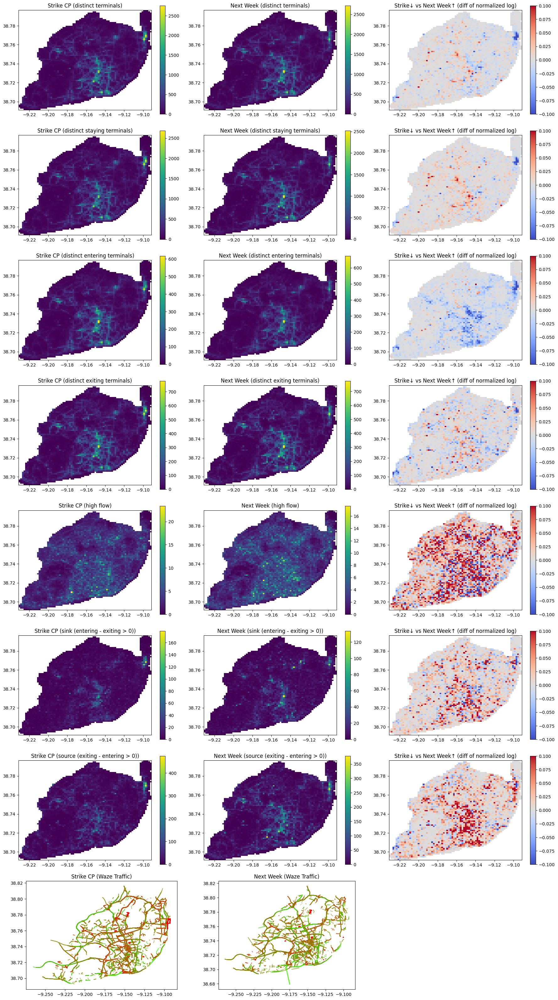

In [88]:
metrics = [
    { "col": "C1", "name": "distinct terminals" },
    { "col": "C3", "name": "distinct staying terminals" },
    { "col": "C5", "name": "distinct entering terminals" },
    { "col": "C6", "name": "distinct exiting terminals" },
    { "col": "high_flow_heuristic", "name": "high flow" },
    { "col": "sink", "name": "sink (entering - exiting > 0)" },
    { "col": "source", "name": "source (exiting - entering > 0)" },
]

fig, axs = plt.subplots(len(metrics)+1,3,figsize=(3*6, 4*(len(metrics)+1)), squeeze=False)

for idx, metric in enumerate(metrics):
    
    grid_mapping_image_strike = create_grid_map(df_agg_data_strike_cp, metric["col"])
    plot_grid_map(grid_mapping_image_strike, axs[idx][0])
    axs[idx][0].set_title("Strike CP ({})".format(metric["name"]))

    grid_mapping_image_strike_next = create_grid_map(df_agg_data_strike_cp_next, metric["col"])
    plot_grid_map(grid_mapping_image_strike_next, axs[idx][1])
    axs[idx][1].set_title("Next Week ({})".format(metric["name"]))

    grid_mapping_image = log_normalize_grid(grid_mapping_image_strike_next) - log_normalize_grid(grid_mapping_image_strike)
    grid_mapping_image = np.exp(grid_mapping_image) - 1
    vmax = np.max(grid_mapping_image)
    vmin = np.min(grid_mapping_image)
    lv = np.max([np.abs(vmax), np.abs(vmin)])
    vmax = lv
    vmin = -lv
    plot_grid_map(
        grid_mapping_image,
        axs[idx][2],
        cmap="coolwarm",
        vmin=vmin,
        vmax=vmax
        
    )
    axs[idx][2].set_title("Strike↓ vs Next Week↑ (diff of normalized log)")

gdf_strike.plot(ax=axs[len(metrics)][0], color=gdf_strike["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][0].set_title("Strike CP (Waze Traffic)")

gdf_strike_next.plot(ax=axs[len(metrics)][1], color=gdf_strike_next["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][1].set_title("Next Week (Waze Traffic)")

axs[len(metrics)][2].axis('off')
    
plt.tight_layout()
plt.show()

The impact of the CP Strike is hard to be perceived in the mobile grid data, but in the Waze traffic it is evident that the roads were a lot busier.

A caveat over these analysis is the one where several impactful events may be occurring concurrently, making it hard to perceive causality. As such the conclusions taken should be carefuly evaluated by domain experts.

Obviously by aggregating several events of the same nature, the patterns of the impacts should be noticeable, but that would require more and better that, as it stands the current data is quite noisy and plagued with several quality issues.

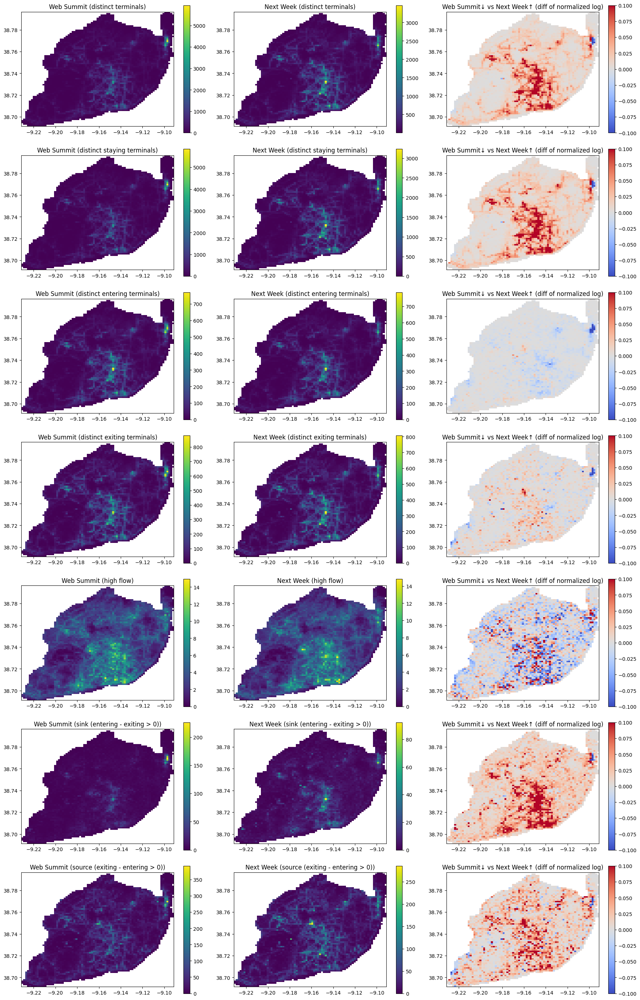

In [89]:
metrics = [
    { "col": "C1", "name": "distinct terminals" },
    { "col": "C3", "name": "distinct staying terminals" },
    { "col": "C5", "name": "distinct entering terminals" },
    { "col": "C6", "name": "distinct exiting terminals" },
    { "col": "high_flow_heuristic", "name": "high flow" },
    { "col": "sink", "name": "sink (entering - exiting > 0)" },
    { "col": "source", "name": "source (exiting - entering > 0)" },
]

fig, axs = plt.subplots(len(metrics),3,figsize=(3*6, 4*len(metrics)), squeeze=False)

for idx, metric in enumerate(metrics):
    
    grid_mapping_image_web = create_grid_map(df_agg_data_web, metric["col"])
    plot_grid_map(grid_mapping_image_web, axs[idx][0])
    axs[idx][0].set_title("Web Summit ({})".format(metric["name"]))

    grid_mapping_image_web_next = create_grid_map(df_agg_data_web_next, metric["col"])
    plot_grid_map(grid_mapping_image_web_next, axs[idx][1])
    axs[idx][1].set_title("Next Week ({})".format(metric["name"]))

    grid_mapping_image = log_normalize_grid(grid_mapping_image_web_next) - log_normalize_grid(grid_mapping_image_web)
    grid_mapping_image = np.exp(grid_mapping_image) - 1
    vmax = np.max(grid_mapping_image)
    vmin = np.min(grid_mapping_image)
    lv = np.max([np.abs(vmax), np.abs(vmin)])
    vmax = lv
    vmin = -lv
    plot_grid_map(
        grid_mapping_image,
        axs[idx][2],
        cmap="coolwarm",
        vmin=vmin,
        vmax=vmax
        
    )
    axs[idx][2].set_title("Web Summit↓ vs Next Week↑ (diff of normalized log)")

plt.tight_layout()
plt.savefig("grid_events_web.png")    
plt.show()

The web summit had quite an impact in the attendance of Parque das Nações, more than doubling the people that visit that area.

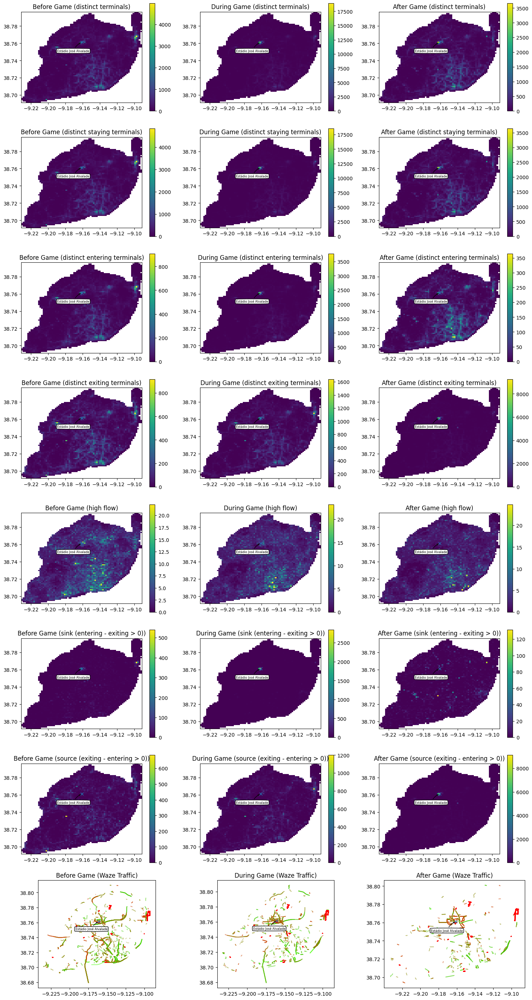

In [90]:
metrics = [
    { "col": "C1", "name": "distinct terminals" },
    { "col": "C3", "name": "distinct staying terminals" },
    { "col": "C5", "name": "distinct entering terminals" },
    { "col": "C6", "name": "distinct exiting terminals" },
    { "col": "high_flow_heuristic", "name": "high flow" },
    { "col": "sink", "name": "sink (entering - exiting > 0)" },
    { "col": "source", "name": "source (exiting - entering > 0)" },
]

fig, axs = plt.subplots(len(metrics)+1,3,figsize=(2.5*6, 3.5*(len(metrics)+1)), squeeze=False)

for idx, metric in enumerate(metrics):
    
    grid_mapping_image_prev = create_grid_map(df_agg_data_alvalade_prev, metric["col"])
    plot_grid_map(grid_mapping_image_prev, axs[idx][0])
    axs[idx][0].set_title("Before Game ({})".format(metric["name"]))

    plot_points_of_interest(["Estádio José Alvalade"], axs[idx][0], offsets=[(-0.01, 0.01)])

    grid_mapping_image_game = create_grid_map(df_agg_data_alvalade_game, metric["col"])
    plot_grid_map(grid_mapping_image_game, axs[idx][1])
    axs[idx][1].set_title("During Game ({})".format(metric["name"]))

    plot_points_of_interest(["Estádio José Alvalade"], axs[idx][1], offsets=[(-0.01, 0.01)])

    grid_mapping_image_next = create_grid_map(df_agg_data_alvalade_next, metric["col"])
    plot_grid_map(grid_mapping_image_next, axs[idx][2])
    axs[idx][2].set_title("After Game ({})".format(metric["name"]))
    
    plot_points_of_interest(["Estádio José Alvalade"], axs[idx][2], offsets=[(-0.01, 0.01)])


gdf_alvalade_prev.plot(ax=axs[len(metrics)][0], color=gdf_alvalade_prev["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][0].set_title("Before Game (Waze Traffic)")

plot_points_of_interest(["Estádio José Alvalade"], axs[len(metrics)][0], offsets=[(-0.01, 0.01)])

gdf_alvalade_game.plot(ax=axs[len(metrics)][1], color=gdf_alvalade_game["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][1].set_title("During Game (Waze Traffic)")

plot_points_of_interest(["Estádio José Alvalade"], axs[len(metrics)][1], offsets=[(-0.01, 0.01)])

gdf_alvalade_next.plot(ax=axs[len(metrics)][2], color=gdf_alvalade_next["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][2].set_title("After Game (Waze Traffic)")

plot_points_of_interest(["Estádio José Alvalade"], axs[len(metrics)][2], offsets=[(-0.01, 0.01)])

plt.tight_layout()
plt.show()

It is fairly easy to see the impacts of a big game in Alvalade Stadium.

This analysis could benefit from a comparison in absolute values, however we didn't have time to explore other aggregations and possible filterings.

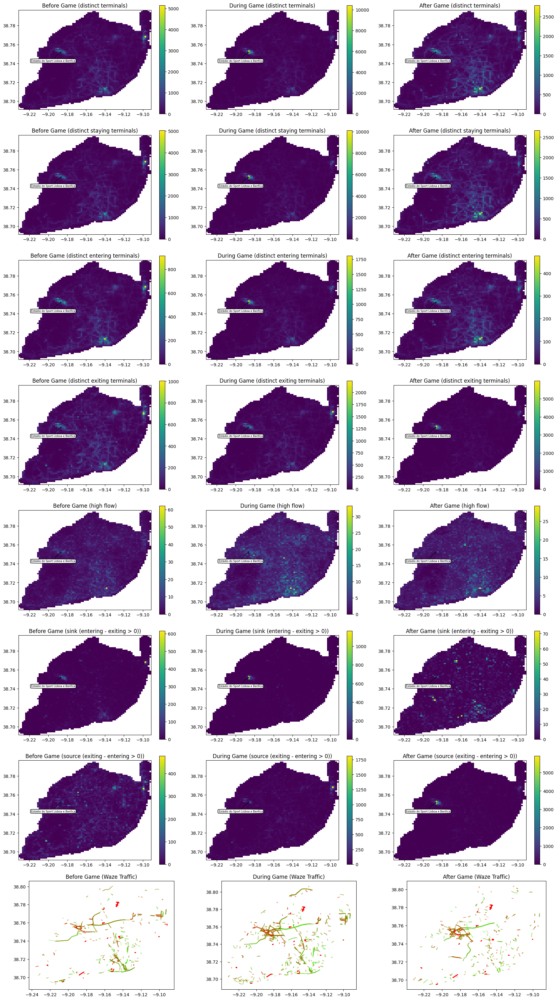

In [91]:
metrics = [
    { "col": "C1", "name": "distinct terminals" },
    { "col": "C3", "name": "distinct staying terminals" },
    { "col": "C5", "name": "distinct entering terminals" },
    { "col": "C6", "name": "distinct exiting terminals" },
    { "col": "high_flow_heuristic", "name": "high flow" },
    { "col": "sink", "name": "sink (entering - exiting > 0)" },
    { "col": "source", "name": "source (exiting - entering > 0)" },
]

fig, axs = plt.subplots(len(metrics) + 1,3,figsize=(3*6, 4*(len(metrics) + 1)), squeeze=False)

for idx, metric in enumerate(metrics):
    
    grid_mapping_image_prev = create_grid_map(df_agg_data_luz_prev, metric["col"])
    plot_grid_map(grid_mapping_image_prev, axs[idx][0])
    axs[idx][0].set_title("Before Game ({})".format(metric["name"]))

    plot_points_of_interest(["Estádio do Sport Lisboa e Benfica"], axs[idx][0], offsets=[(-0.01, 0.01)])

    grid_mapping_image_game = create_grid_map(df_agg_data_luz_game, metric["col"])
    plot_grid_map(grid_mapping_image_game, axs[idx][1])
    axs[idx][1].set_title("During Game ({})".format(metric["name"]))

    plot_points_of_interest(["Estádio do Sport Lisboa e Benfica"], axs[idx][1], offsets=[(-0.01, 0.01)])

    grid_mapping_image_next = create_grid_map(df_agg_data_luz_next, metric["col"])
    plot_grid_map(grid_mapping_image_next, axs[idx][2])
    axs[idx][2].set_title("After Game ({})".format(metric["name"]))
    
    plot_points_of_interest(["Estádio do Sport Lisboa e Benfica"], axs[idx][2], offsets=[(-0.01, 0.01)])

gdf_luz_prev.plot(ax=axs[len(metrics)][0], color=gdf_luz_prev["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][0].set_title("Before Game (Waze Traffic)")

gdf_luz_game.plot(ax=axs[len(metrics)][1], color=gdf_luz_game["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][1].set_title("During Game (Waze Traffic)")

gdf_luz_next.plot(ax=axs[len(metrics)][2], color=gdf_luz_next["level"].apply(lambda x: level_colors[int(x)]), alpha=0.3)
axs[len(metrics)][2].set_title("After Game (Waze Traffic)")
    
plt.tight_layout()
plt.savefig("grid_events_luz.png")    
plt.show()

Again, a soccer match in a major club stadium is clearly measurable.

### Predictions and modeling

Due to the data quality and constrains with joining the data sources we didn't advance into a predictive model, however we leave concept here.

By using the grid data and the traffic data it should be possible to associate the that data with events in given points of interest, by windowing in time the data (and possibly aggregating it) and using it as an input for a supervised learning model where the outputs are the after state (as grid metrics and traffic) for a given (event, poi) tuple.

With such a model it would be possible to find the impacts that a given event (or a set of compounded events) would have when occurring at a given time. We feel that for this solution to be solid not only better data, but more data would be required. A caveat/limition of this solution would be the occurrence of unexpected events never seen before.

Sadly we didn't have time to follow this endevour.

## 🖼️ Visualisations

### Overview

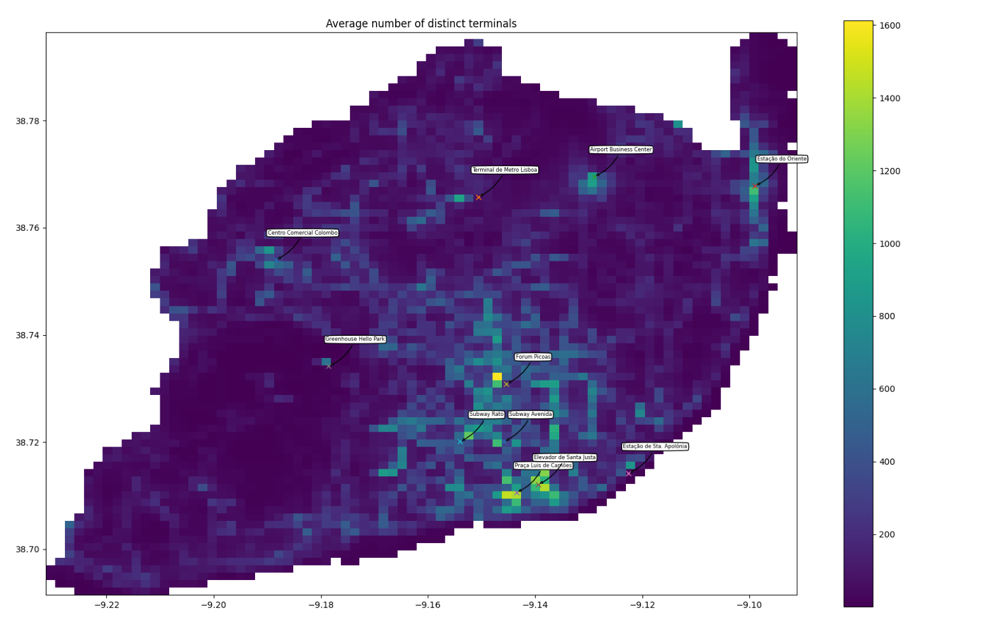

In [92]:
img = mpimg.imread("grid_global_distinct_terminals.png")
plt.figure(figsize=(16,10))
imgplot = plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

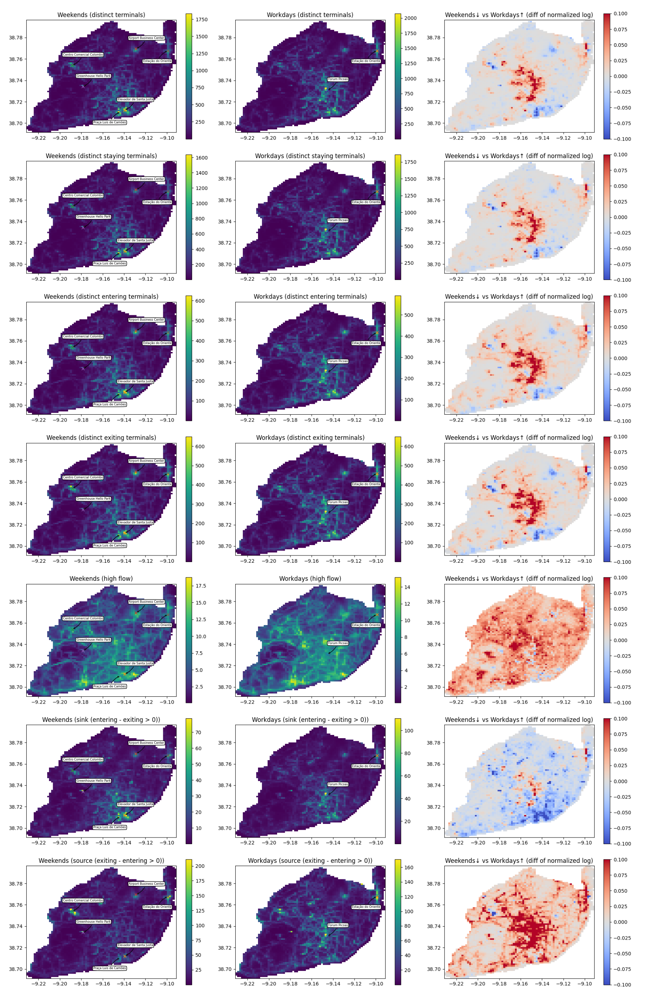

In [93]:
import matplotlib.image as mpimg
img = mpimg.imread("grid_global_weekends.png")
plt.figure(figsize=(3*6, 4*7))
imgplot = plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

### Events

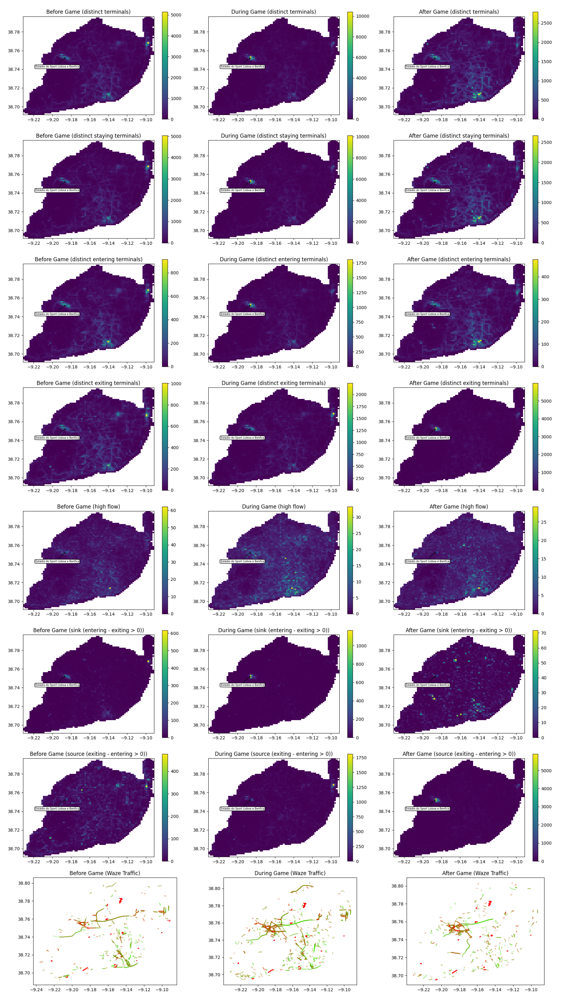

In [94]:
import matplotlib.image as mpimg
img = mpimg.imread("grid_events_luz.png")
plt.figure(figsize=(3*6, 4*8))
imgplot = plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

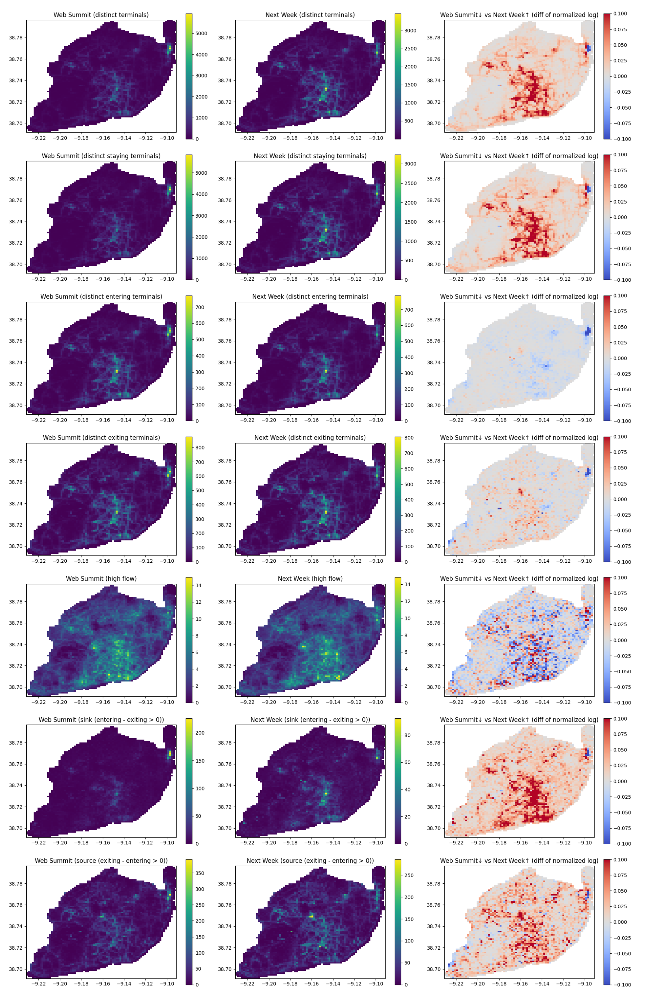

In [95]:
import matplotlib.image as mpimg
img = mpimg.imread("grid_events_web.png")
plt.figure(figsize=(3*6, 4*7))
imgplot = plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

### Kepler dashboard visualizations

**Waze traffic jams workday profile**

In [96]:
df_waze_2022_11["Time"] = df_waze_2022_11["entity_ts"].dt.time.astype("str")
df_waze_2022_11["is_workday"] = df_waze_2022_11["entity_ts"].dt.day_of_week.isin([0,1,2,3,4])
df_waze_2022_11.sort_values("Time", inplace=True)

map_example = KeplerGl()
map_example.add_data(data=df_waze_2022_11.drop(columns=["entity_ts"]), name="waze_data")
map_example.save_to_html(file_name="map_waze.html")

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


/mnt/md0/zeca/WDL/venv/lib/python3.10/site-packages/jupyter_client/session.py:719: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


Map saved to map_waze.html!


Reproduce results shown for traffic jams, on Kepler:
1. Open map_waze.html in the browser
2. Center the map in Lisbon
3. Under layers, change the stroke color to red and select color based on delay
4. StrokeColor Scale set to "quantize"
5. Under Stroke Width, select Stroke Based On "level" and set the maximum width to 4
6. On filters, as a filter for the variable "is_workday" and select 1 if the objective 
is to observe the values during the work days, 0 otherwise
7. Add another filter for the variable "Time"
8. Select a starting time window
9. Start the animation

(The animation speed and window size are configurable)

**Grid evolution**

In [97]:
df_grid_devices = df_dispositivos[
    (df_dispositivos["Datetime"]>="2022-11-01") &
    (df_dispositivos["Datetime"]<"2022-11-02")
].merge(df_grids, how = "left", left_on='Grid_ID', right_on='grelha_id')
df_grid_devices["Date"] = df_grid_devices["Datetime"].dt.date.astype("str")
df_grid_devices["Time"] = df_grid_devices["Datetime"].dt.time.astype("str")
df_grid_devices["is_workday"] = df_grid_devices["Datetime"].dt.day_of_week.isin([0,1,2,3,4])
df_grid_devices["Flow"] = df_grid_devices[["C5", "C6"]].max(axis=1) / (abs(df_grid_devices["C5"] - df_grid_devices["C6"]) + 1)
df_grid_devices.sort_values("Time", inplace=True)
# To avoid serialization issues
df_grid_devices["Datetime"] = df_grid_devices["Datetime"].dt.strftime('%Y-%m-%dT%H:%M:%SZ')
map_example = KeplerGl()
map_example.add_data(data=df_grid_devices, name="devices_over_time")
map_example.save_to_html(file_name="map_devices.html")

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to map_devices.html!


Reproduce results shown for grid, on Kepler:
1. Open map_devices.html in the browser
2. Center the map in Lisbon
3. Under layers, change point to grid
4. Change grid size to 0.2
5. Under color, change color scale to quantize and "Aggregate C1 By" sum
6. Under radius, change coverage to 0.8 (optional)
7. On filters, click "Add Filter" and choose the variable Datetime
8. Select a starting time window
9. Start the animation

(The animation speed and window size are configurable)

## 👓 References

| Scope | External link |
| --- | --- |
| Events in Lisbon 2022-09 to 2022-11 | https://www.visitlisboa.com/en/events?page=2&q%5Bend_at%5D=&q%5Bplaces_locations_id_in%5D%5B%5D=1&q%5Bplaces_locations_id_in%5D%5B%5D=6&q%5Bplaces_locations_id_in%5D%5B%5D=29&q%5Bplaces_locations_id_in%5D%5B%5D=30&q%5Bstart_at%5D=2022-09-02
| Locations | https://lisboaaberta.cm-lisboa.pt/index.php/en/dados/conjuntos-de-dados |
| Soccer Matches | https://www.zerozero.pt/estadio.php?id=12&search=1 https://www.zerozero.pt/estadio.php?id=10&search=1 |

## ⏭️ Appendix

### Beato 1st November Event

We are not sure what event it was, but it seems to be a real event and not an error of data.

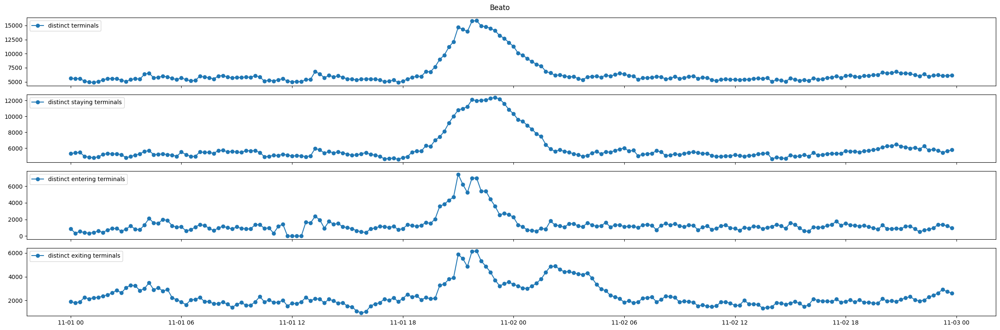

In [98]:
from tqdm.auto import tqdm

metrics = [
    { "col": "C1", "name": "distinct terminals" },
    { "col": "C3", "name": "distinct staying terminals" },
    { "col": "C5", "name": "distinct entering terminals" },
    { "col": "C6", "name": "distinct exiting terminals" },
]

freg = "Beato"

fig, axs = plt.subplots(4,1, figsize=(24,2*len(metrics)), squeeze=False, sharex=True)

df_grid_id = df_dispositivos.loc[
    (df_dispositivos["Grid_ID"].isin(df_grids[df_grids["freguesia"]==freg]["grelha_id"]))
    & (df_dispositivos["Datetime"]>="2022-11-01")
    & (df_dispositivos["Datetime"]<"2022-11-03")
    ,
    ["Datetime", *map(lambda x: x["col"], metrics)]
].groupby("Datetime").sum().reset_index().merge(
    pd.Series(pd.date_range(start=df_dispositivos["Datetime"].min(), end=df_dispositivos["Datetime"].max(), freq="15T")).to_frame("Datetime"),
    how="outer",
    on=["Datetime"]
).sort_values(by=["Datetime"])

xx = df_grid_id["Datetime"]

for i, metric in enumerate(metrics):
    yy = df_grid_id[metric["col"]]
    axs[i][0].plot(xx, yy, alpha=1, marker='o', label=metric["name"])
    axs[i][0].set_facecolor('white')
    axs[i][0].legend(loc="upper left")

fig.suptitle(freg)

fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()

In [99]:
df_agg_data_1_nov = df_dispositivos[
    (df_dispositivos["Datetime"] >= "2022-11-01 18:00:00") &
    (df_dispositivos["Datetime"] < "2022-11-02")
].groupby(
    ["Grid_ID"]
).sum(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

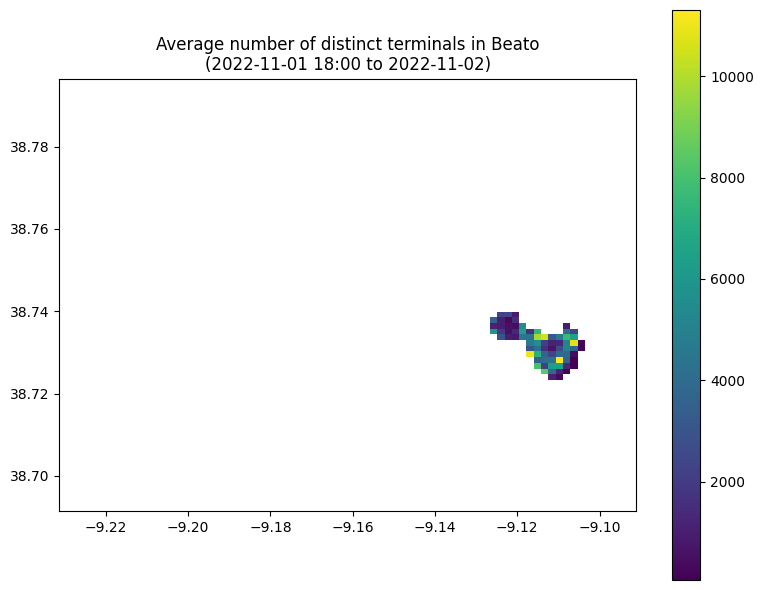

In [100]:
df_agg_data_1_nov_beato = df_agg_data_1_nov[df_agg_data_1_nov["freguesia"].isin(["Beato"])]
grid_mapping_image = create_grid_map(df_agg_data_1_nov_beato, "C1")
    
fig, axs = plt.subplots(1,1,figsize=(8,6), squeeze=False)

im = plot_grid_map(grid_mapping_image, axs[0][0])

axs[0][0].set_title("Average number of distinct terminals in Beato\n(2022-11-01 18:00 to 2022-11-02)")
        
plt.tight_layout()
plt.show()

In [101]:
df_agg_data_1_nov = df_dispositivos[
    (df_dispositivos["Datetime"] >= "2022-11-02 18:00:00") &
    (df_dispositivos["Datetime"] < "2022-11-03 00:00:00")
].groupby(
    ["Grid_ID"]
).sum(numeric_only=True).reset_index().merge(
    df_grids_lut,
    left_on=["Grid_ID"],
    right_on=["grelha_id"]
)

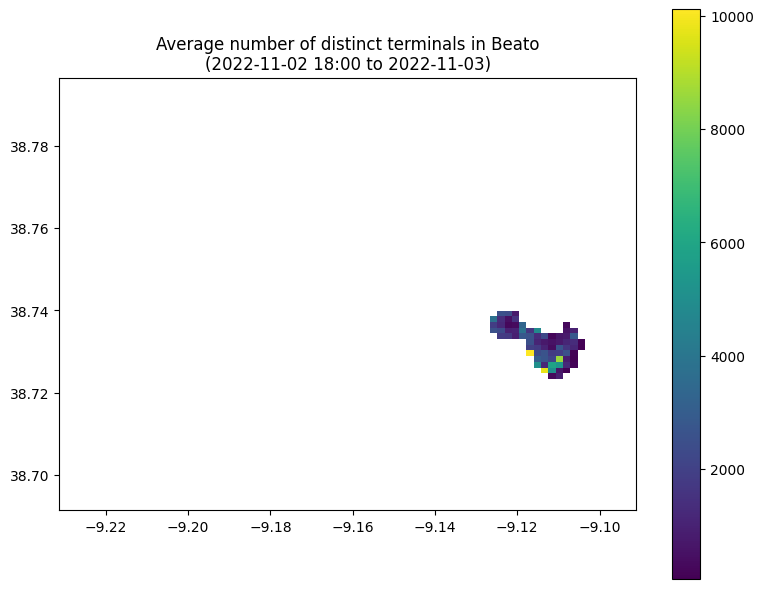

In [102]:
df_agg_data_1_nov_beato = df_agg_data_1_nov[df_agg_data_1_nov["freguesia"].isin(["Beato"])]
grid_mapping_image = create_grid_map(df_agg_data_1_nov_beato, "C1")
    
fig, axs = plt.subplots(1,1,figsize=(8,6), squeeze=False)

im = plot_grid_map(grid_mapping_image, axs[0][0])

axs[0][0].set_title("Average number of distinct terminals in Beato\n(2022-11-02 18:00 to 2022-11-03)")
        
plt.tight_layout()
plt.show()

### Associate Waze to Grid

If the need to join the waze metrics with the grid data arises, it can be achieved by mapping the paths into the grid.

As an example we map the waze streets by incrementing the number of times a street traffic data shows in a cell

In [103]:
def plot_waze_to_grid(gdf, ax, title):
    grid_y_size = len(longitudes)
    grid_x_size = len(latitudes)

    grid_mapping_mask = np.zeros(shape=(grid_y_size, grid_x_size))
    grid_mapping_image = np.zeros(shape=(grid_y_size, grid_x_size))

    for geom in gdf.geometry:
        longs, lats = geom.geoms[0].geoms[0].coords.xy
        longs = long_to_x(longs).round().astype("int")
        lats = lat_to_y(lats).round().astype("int")
        mask = (longs < grid_y_size) & (longs > 0) & (lats < grid_x_size) & (lats > 0)
        for y,x in zip(longs[mask],lats[mask]):
            grid_mapping_mask[y][x] = 1
            grid_mapping_image[y][x] += 1

    im = ax.imshow(
        np.log(grid_mapping_image.transpose((1,0))+1),
        alpha=1,
        origin="lower",
        extent=(
            df_grids["longitude"].min(),
            df_grids["longitude"].max(),
            df_grids["latitude"].min(),
            df_grids["latitude"].max()
        )
    )

    ax.set_title(title)
    
    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("", rotation=-90, va="center")


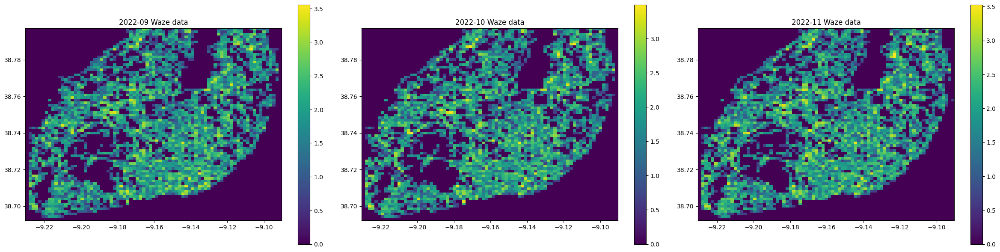

In [104]:
fig, axs = plt.subplots(1,3,figsize=(24,6), squeeze=False)

plot_waze_to_grid(
    gdf_waze_2022_09_positions,
    axs[0][0],
    "2022-09 Waze data"
)

plot_waze_to_grid(
    gdf_waze_2022_10_positions,
    axs[0][1],
    "2022-10 Waze data"
)

plot_waze_to_grid(
    gdf_waze_2022_11_positions,
    axs[0][2],
    "2022-11 Waze data"
)

if False:
    for row in df_freguesias_centrums.reset_index().itertuples():
        x = long_to_x(row.longitude)
        y = lat_to_y(row.latitude)

        axs[0][0].annotate(
            row.freguesia,
            xy=(row.longitude, row.latitude),
            xytext=(row.longitude, row.latitude),
            ha='center', va='center'
        )
        
plt.tight_layout()
plt.show()

### Metadata descriptions

For reference and completeness, in this section with describe the metadata associated with this challenge

#### Grid Data<a id='meta-grid' name='meta-grid'></a> 

**DISPOSITIVOS MOVEIS_QUADRICULAS**

**File:** `lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_QUADRICULAS/DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx`

Coordinates of the centroids of the 200x200 m squares, in the city of Lisbon

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | Mobile service provider |
| Format (txt, csv, xls, json, etc.) | xls |
| Start date | |
| End date (last update) | |
| Granularity | |
| Number of records | 3742 |
    
</div><div style="clear:both"></div>

**VODAFONE_QUADRICULAS**

<div style="float:left">

| Field name | Description | Field type |
| --- | --- | --- |
| grelha_id | Grid number | numeric |
| freguesia | Civil parish of the grid | text |
| latitude | Latitude | numeric |
| longitude | Longitude | numeric |

</div><div style="clear:both"></div>

**CML – DISPOSITIVOS MOVEIS_GRELHA**

**Files:**<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_09_0001_4000.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_10_0001_4000.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_11_0001_4000.csv`<br>

Information on the number of active mobile phones per square of 200m/200m every 15 minutes - Squares of the city of Lisbon

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | Mobile service provider |
| Format (txt, csv, xls, json, etc.) | CSV |
| Start date | 01.09.2022 |
| End date (last update) | 30.11.2022 |
| Granularity | 15 minutes |
| Number of records | > 1M |

</div><div style="clear:both"></div>
    
    
**Indicators**

<div style="float:left">

| Field | Description |
| --- | --- |
| C.1 |  Number of distinct terminals in the grid |
| C.2 | Number of different terminals, in roaming, in the grid |
| C.3 | Number of different terminals that remained in the grid |
| C.4 | Number of different terminals that remained in the grid, in roaming |
| C.5 | Number of different terminal entries in the grid |
| C.6 | Number of different terminal outputs in the grid |
| C.7 | Number of different terminal entries, in roaming, in the grid |
| C.8 | Number of outputs from different terminals, in roaming, in the grid |
    
</div><div style="clear:both"></div>

**CML_DISPOSITIVOS MOVEIS_EIXOS**

**File:** `lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv`

Number of mobile phones entering and leaving the city every 15 minutes on the 11 main road axes in the city of Lisbon

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | Mobile service provider |
| Format (txt, csv, xls, json, etc.) | CSV |
| Start date | 01.09.2022 |
| End date (last update) | 30.11.2022 |
| Granularity | 15 minutes |
| Number of records | >1M |
    
</div><div style="clear:both"></div>

**Indicators**

<div style="float:left">

| Field | Description |
| --- | --- |
| C.12 | Number of entrances in Lisbon by the 11 main road axes      |
| C.13 | Number of departures from Lisbon on the 11 main road routes |

</div><div style="clear:both"></div>

**Main road axes (11)**
* A1
* A5
* A36 (Túnel do Grilo)
* Calçada Carriche
* IC2 (Sacavém)
* IC16
* IC19
* Marginal
* N117 (Cabos d' Ávila)
* Ponte 25 Abril
* Ponte Vasco Gama



#### Main road axis data

**CML_DISPOSITIVOS MOVEIS_EIXOS**

**File:** `lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv`

Number of mobile phones entering and leaving the city every 15 minutes on the 11 main road axes in the city of Lisbon

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | Mobile service provider |
| Format (txt, csv, xls, json, etc.) | CSV |
| Start date | 01.09.2022 |
| End date (last update) | 30.11.2022 |
| Granularity | 15 minutes |
| Number of records | >1M |
    
</div><div style="clear:both"></div>

**Indicators**

<div style="float:left">

| Field | Description |
| --- | --- |
| C.12 | Number of entrances in Lisbon by the 11 main road axes      |
| C.13 | Number of departures from Lisbon on the 11 main road routes |

</div><div style="clear:both"></div>

**Main road axes (11)**
* A1
* A5
* A36 (Túnel do Grilo)
* Calçada Carriche
* IC2 (Sacavém)
* IC16
* IC19
* Marginal
* N117 (Cabos d' Ávila)
* Ponte 25 Abril
* Ponte Vasco Gama

**DISPOSITIVOS MOVEIS_TROÇOS DE VIA_PONTOS**

**Files:**<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.prj`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.shp`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.cpg`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.shx`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOS VIA_PONTOS/Entradas_Lx.dbf`

Mapping of the 11 entry and exit points in Lisbon

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | Mobile service provider |
| Format (txt, csv, xls, json, etc.) | shp |
| Start date | |
| End date (last update) | |
| Granularity | |
| Number of records | 11 |
    
</div><div style="clear:both"></div>

**DISPOSITIVOS MOVEIS_TROÇOS DE VIA_TROÇOS DE VIA**

**Files:**<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOSVIA_POLIGONOS/eixos_polygon.shp`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOSVIA_POLIGONOS/eixos_polygon.prj`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOSVIA_POLIGONOS/eixos_polygon.cpg`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOSVIA_POLIGONOS/eixos_polygon.shx`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/DISPOSITIVOS MOVEIS_TROÇOS DE VIA/DISPOSITIVOS MOVEIS_TROÇOSVIA_POLIGONOS/eixos_polygon.dbf`

Mapping of road sections used to calculate city entrances and exits	

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | Mobile service provider |
| Format (txt, csv, xls, json, etc.) | shapefile |
| Start date | |
| End date (last update) | |
| Granularity | |
| Number of records | 11 |
    
</div><div style="clear:both"></div>

#### EMEL - Traffic Conditioning

**CML_CONDICIONAMENTOS_TRANSITO**

**File:** `lisbon_ficheiros_WDL/ficheiros_WDL/CONDICIONAMENTOS TRANSITO/CONDICIONAMENTOS TRANSITO_Set_Out_Nov2022.csv`

Registration of traffic conditioning/restrictions		

**Metadados**


<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | EMEL |
| Format (txt, csv, xls, json, etc.) | xls/csv |
| Start date | 01.09.2022 | 
| End date (last update) | 30.11.2022 |
| Granularity | Occasional |
| Number of records | |

</div><div style="clear:both"></div>

**EMEL_CONDICIONAMENTOS_TRANSITO**

<div style="float:left">

| Field name | Description | Field type |
| --- | --- | --- |
| entity_id | Entity ID | text |
| impacto | Impact of the conditioning/restriction (relevant, slightly relevant) | text |
| restricao_circulacao | Type of traffic restriction (road narrowing, parking, total cut, maintain road profile, filming, temporary cut, work - carriageway, sidewalk, parking reservation) | text |
| morada | Conditioning/restriction address | text |
| periodos_condicionamentos | Condition periods | Date/Hour |
| motivo | Reason for restriction of circulation (road narrowing, parking, total cut, maintains track profile, filming, temporary cut, work - carriageway, concentrations, painting, changes, repaving, sidewalk, parking reservation) | text |
| position | Georeferenced location of the conditioning/restriction | numeric |
| creation_date | Creation of the conditioning/restriction record | Date/Hour |

</div><div style="clear:both"></div>



#### Waze - Traffic

**WAZE_JAMS**

**Files:**<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Out2022/CML_waze_jams_102022_2.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Out2022/CML_waze_jams_102022_1.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Nov2022/CML_waze_jams_112022_1.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Nov2022/CML_waze_jams_112022_3.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Nov2022/CML_waze_jams_112022_2.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_3.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_2.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_1.csv`<br>
`lisbon_ficheiros_WDL/ficheiros_WDL/Waze_QUEBRA DE SERIE/Set2022/CML_waze_jams_092022_4.csv`

Traffic level data recorded through the WAZE platform	

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | WAZE |
| Format (txt, csv, xls, json, etc.) | xls/csv |
| Start date | 01.09.2022 |
| End date (last update) | 30.11.2020 |
| Granularity | Real time |
| Number of records | > 1 Million |
| Notes: | There is a series break in Waze dataset (between 30/09/2022 e 9/10/2022), and an inconsistency in the structure of the data before 09/30/2022 after 10/9/2022. |
        
</div><div style="clear:both"></div>

**WAZE_JAMS**

<div style="float:left">

| Field name | Description | Unit | Field type |
| --- | --- | --- | --- |
| entity_ts | Timestamp of occurrence registration on the platform | NA | numeric |
| entity_id | Congestion identification code | NA | text |
| street | Road | NA | text |
| position | Online georeferencing - Latitude/Longitude | | numeric |
| level | Congestion Level Code (0 = free of traffic 5 = road blocked):<br>0 = traffic free flow speed at 80% traffic free flow speed<br>1 = 80% to 61% traffic free flow speed<br>2 = 60% to 41%<br>3 = 40% to 21%<br>4 = 20% to 1%<br>5 = road blocked<div> | NA | numeric |
| length | Average jam length | meters | numeric |
| delay | Delay relative to speed without traffic (in case of blockage = -1) | seconds | numeric |
| speed | Average speed in a segment | meters/seconds | numeric |

</div><div style="clear:both"></div>

#### CML - Road Network

**CML_REDE VIÁRIA**

**Files available at:** https://geodados-cml.hub.arcgis.com/datasets/rede-vi%C3%A1ria/

Mapping of the road network in the city of Lisbon

**Metadata**

<div style="float:left">

| Detail | Description |
| --- | --- |
| Entity (source entity or service) | Geodata |
| Format (txt, csv, xls, json, etc.) | CSV, KML, SHP, GEOJSON |
| Start date | |
| End date (last update) | |
| Granularity | |
| Number of records | |
| Notes: | https://geodados-cml.hub.arcgis.com/datasets/rede-vi%C3%A1ria/ |
        
</div><div style="clear:both"></div>